# Especialização em Ciência de Dados e Analytics - PUC-Rio

# MVP de Machine Learning & Analytics

## Profs. Tatiana Escovedo, Hugo Ricardo Guarin Villamizar, Jonatas Dos Santos Grosman, Luiz José Schirmer Silva e Patrick Nigri Happ

### Aluno: Daniel de Almeida Azevedo Silva

### Tema: Prever a evasão e o sucesso acadêmico dos alunos



#1 Definição do Problema

Antes de iniciarmos a construção do modelo preditivo, precisamos não só ter claros os objetivos que desejamos alcançar, como também assegurar que os dados estarão adequados para serem submetidos aos algoritmos. Para tal, é fundamental traçar uma sequência de etapas de execuções ao longo do projeto, a fim de garantir maiores chances de obtenção de bons resultados. De forma macro, o projeto será dividido em oito etapas de execuções: Entendimento do problema, Identificação da necessidade, Coleta e análise de dados, Pré-processamento, **Modelagem e inferência, Pós-Processamento, Apresentação dos Resultados, Implantação do modelo e verificação da geração de valor**. Neste MVP focaremos nas 5 últimas etapas destacadas anteriormente em negrito.

O dataset escolhido é um conjunto de dados criado a partir de uma instituição de ensino superior (adquirido de diversas bases de dados disjuntas) relacionado a alunos matriculados em diferentes cursos de graduação, como agronomia, design, educação, enfermagem, jornalismo, gestão, serviço social e tecnologias. O conjunto de dados inclui informações conhecidas no momento da matrícula dos alunos (percurso acadêmico, dados demográficos e fatores socioeconômicos) e o desempenho acadêmico dos alunos no final do primeiro e segundo semestres. Os dados são usados ​​para construir modelos de classificação para prever o abandono e o sucesso acadêmico dos alunos. O problema é formulado como uma tarefa de classificação de três categorias, na qual existe um forte desequilíbrio em relação a uma das classes.

O conjunto de dados foi criado em um projeto que pretende contribuir para a redução do abandono e do insucesso acadêmico no ensino superior, através da utilização de técnicas de aprendizagem automática para identificar alunos em risco numa fase inicial do seu percurso académico, para que possam ser implementadas estratégias de apoio aos mesmos e estas postas em prática.

O conjunto de dados inclui informações conhecidas no momento da matrícula do aluno – percurso acadêmico, dados demográficos e fatores socioeconômicos.

O problema é formulado como uma tarefa de classificação de três categorias (abandono[dropout], matriculado[enrolled] e graduado[graduated]) ao final do período normal do curso. Cada instância contempla dados de um aluno.

Este conjunto de dados é apoiado pelo programa SATDAP - Capacitação da Administração Pública (subvenção POCI-05-5762-FSE-000191, Portugal).

## 1.2 Colunas do Dataset

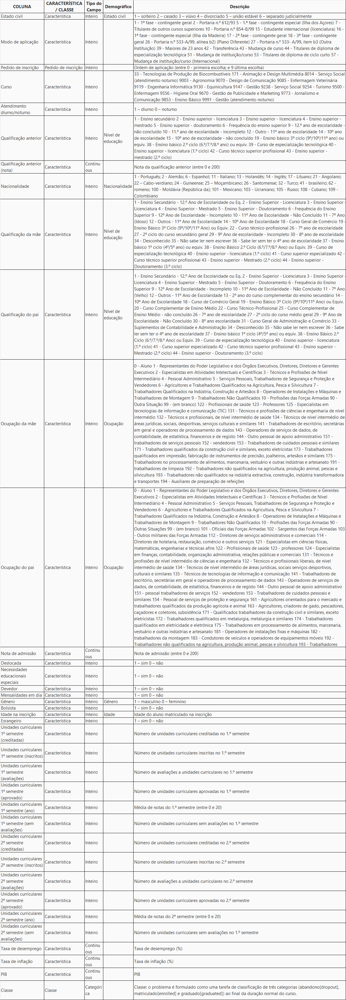

O dicionário de dados das colunas Mother's qualification e Father's qualification contém duplicidade na qualificação "Ensino superior - Licenciatura". Esta está atrelada aos códigos 2 e 3. Na etapa de pré-processamento trataremos esta duplicidade, elegendo o código 2 como identificador da qualificação em questão.

# 2 CARGA DE DADOS

## 2.1 IMPORTS e FUNÇÕES

In [ ]:
#Imports
# configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Importação de pacotes
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as ms

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing   import StandardScaler # para padronização
from sklearn.preprocessing   import MinMaxScaler # para normalização
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics         import classification_report
from sklearn.metrics         import confusion_matrix
from sklearn.metrics         import accuracy_score
from sklearn.pipeline        import Pipeline
from sklearn.linear_model    import LogisticRegression
from sklearn.tree            import DecisionTreeClassifier
from sklearn.neighbors       import KNeighborsClassifier
from sklearn.naive_bayes     import GaussianNB
from sklearn.svm             import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import RFE
from numpy import set_printoptions
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier

In [ ]:
#Funções

#Função para plotar gráfico Boxsplot da coluna do dataset, informados por parâmetro
def plotarBoxplot(dataset, coluna):
  fig =px.box(dataset, y=coluna)
  fig.update_layout(title_text=coluna)
  fig.update_layout(title_text='Boxplot - '+ coluna)
  fig.show()

#Função para plotar Histograma da coluna de um dataset, número bins de colunas e cores edgecolor e color
def plotarHistograma(dataset, colunaDoDataset, bins=7, edgecolor = 'black', color='yellow') :
  #Plotando o Histograma
  plt.hist(dataset, bins=bins, edgecolor=edgecolor, color=color)

  #Incluindo título do gráfico
  plt.title('Distribuição de ' + colunaDoDataset)
  plt.ylabel('Frequência')
  plt.xlabel(colunaDoDataset);

## 2.2 Abrindo o Dataset

In [ ]:
#Abrindo Dataset de ALUNOS a partir da url github público do aluno Daniel de Almeida: 4423 (a primeira linha é o cabeçalho) linhas e 37 colunas/características/atributos
urlGitHubPublicoDanielAlmeida_Proj_ECDA232 = "https://raw.githubusercontent.com/Dani31A1m3ida/ECDA_PUCRIO_232/main/data_predict_students_graduated.csv"

#Labels dos atributos do dataset
labels_atributos = ['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother''s qualification', 'Father''s qualification',
       'Mother''s occupation', 'Father''s occupation',
       'Admission grade', 'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP', 'Target']

#Carga do dataset a partir da url
dataset = pd.read_csv(urlGitHubPublicoDanielAlmeida_Proj_ECDA232 , names=labels_atributos, skiprows=1, sep = ";")

In [ ]:
dataset.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


## 2.3 Listando colunas do Dataset

In [ ]:
# Mostra os nomes das colunas do dataset
colunas=dataset.columns
print(colunas)

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification', 'Fathers qualification', 'Mothers occupation',
       'Fathers occupation', 'Admission grade', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade

Salvando o dataset original completo para fins de comparação após o treinamento dos modelos. O dataset completo será o base line da comparação das acurácias.

In [ ]:
datasetCompleto = dataset[['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification',
       'Fathers qualification', 'Mothers occupation', 'Fathers occupation',
       'Admission grade', 'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP', 'Target']]

In [ ]:
datasetCompleto.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


# 3 Análise de Dados

Antes de iniciarmos a construção do modelo preditivo, precisamos não só ter claros os objetivos que desejamos alcançar, como também assegurar que os dados estarão adequados para serem submetidos aos algoritmos. Para tal, é fundamental traçar uma sequência de etapas de execuções ao longo do projeto, a fim de garantir maiores chances de obtenção de bons resultados. De forma macro, o projeto será dividido em oito etapas de execuções: Entendimento do problema, Identificação da necessidade, Coleta e análise de dados, Pré-processamento, Modelagem e inferência, Pós-Processamento, Apresentação dos Resultados, Implantação do modelo e verificação da geração de valor.


Neste passo realizaremos a análise exploratória da base de dado. O objetivo é conhecer as variáveis disponíveis e verificar se existem casos de informações nulas ou inválidas, duplicidade de dados, outliers e analisar os tipos dos atributos do subdataset, pois pode ser necessário realizar conversões de formatos e as dimensões. Para o estudo foram utilizados recursos visuais como gráficos e tabelas, além de agrupamentos por informações para identificar a representatividade das informações no contexto geral. Ao final desta etapa o objetivo é ter um guia das ações necessárias para criarmos um dataset tratado, limpo e com os dados que serão relevantes para análise dos modelos.

### 3.1. Estatísticas Descritivas

Vamos iniciar examinando as dimensões do dataset, suas informações e alguns exemplos de linhas.

In [ ]:
#Exibindo as primeiras linhas do dataset
dataset.shape

(4424, 37)

Uma vez carregados com os scesso os dados do dataset, observamos que este possui 4424 instâncias de alunos e 37 colunas. Tal alto número de características sugere muita atenção na análise da correlação das variáveis e que será necessária a operação de seleção de características no pré-processmanento.

In [ ]:
# Mostra as 10 primeiras linhas do dataset
dataset.head(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate
5,2,39,1,9991,0,19,133.1,1,37,37,...,0,5,17,5,11.500000,5,16.2,0.3,-0.92,Graduate
6,1,1,1,9500,1,1,142.0,1,19,38,...,0,8,8,8,14.345000,0,15.5,2.8,-4.06,Graduate
7,1,18,4,9254,1,1,119.0,1,37,37,...,0,5,5,0,0.000000,0,15.5,2.8,-4.06,Dropout
8,1,1,3,9238,1,1,137.0,62,1,1,...,0,6,7,6,14.142857,0,16.2,0.3,-0.92,Graduate
9,1,1,1,9238,1,1,138.0,1,1,19,...,0,6,14,2,13.500000,0,8.9,1.4,3.51,Dropout


In [ ]:
### 3.4 Avaliando as 10 últimas linhas do Dataset
dataset.tail(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
4414,1,1,1,9130,1,1,137.0,1,3,38,...,0,5,8,5,11.600000,0,9.4,-0.8,-3.12,Graduate
4415,4,39,1,9500,1,19,133.1,1,37,37,...,0,7,12,3,11.083333,0,11.1,0.6,2.02,Dropout
4416,1,43,2,9500,1,1,136.0,1,38,38,...,11,14,15,12,12.625000,1,7.6,2.6,0.32,Graduate
4417,1,1,1,9070,1,1,132.0,1,1,1,...,0,6,6,6,13.500000,0,16.2,0.3,-0.92,Graduate
4418,1,44,1,9070,1,39,120.0,1,3,38,...,5,9,10,7,13.142857,1,16.2,0.3,-0.92,Graduate
4419,1,1,6,9773,1,1,125.0,1,1,1,...,0,6,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,9773,1,1,120.0,105,1,1,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,9500,1,1,154.0,1,37,37,...,0,8,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9147,1,1,180.0,1,37,37,...,0,5,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate
4423,1,10,1,9773,1,1,152.0,22,38,37,...,0,6,6,6,13.000000,0,12.7,3.7,-1.70,Graduate


#### 3.1.1 Avaliando as primeiras 10 linhas do Dataset

#### 3.1.2 Avaliando as últimas 10 linhas do Dataset

In [ ]:
dataset.tail(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
4414,1,1,1,9130,1,1,137.0,1,3,38,...,0,5,8,5,11.600000,0,9.4,-0.8,-3.12,Graduate
4415,4,39,1,9500,1,19,133.1,1,37,37,...,0,7,12,3,11.083333,0,11.1,0.6,2.02,Dropout
4416,1,43,2,9500,1,1,136.0,1,38,38,...,11,14,15,12,12.625000,1,7.6,2.6,0.32,Graduate
4417,1,1,1,9070,1,1,132.0,1,1,1,...,0,6,6,6,13.500000,0,16.2,0.3,-0.92,Graduate
4418,1,44,1,9070,1,39,120.0,1,3,38,...,5,9,10,7,13.142857,1,16.2,0.3,-0.92,Graduate
4419,1,1,6,9773,1,1,125.0,1,1,1,...,0,6,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,9773,1,1,120.0,105,1,1,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,9500,1,1,154.0,1,37,37,...,0,8,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9147,1,1,180.0,1,37,37,...,0,5,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate
4423,1,10,1,9773,1,1,152.0,22,38,37,...,0,6,6,6,13.000000,0,12.7,3.7,-1.70,Graduate


#### 3.1.3 Tipos dos Atributos

É sempre importante verificar o tipo dos atributos do dataset, pois pode ser necessário realizar conversões.

In [ ]:
# Faz um resumo estatístico do dataset (média, desvio padrão, mínimo, máximo e os quartis)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance	                     4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mothers qualification                           4424 non-null   int64  
 9   Fathers qualification                    

Não existem dados nulos em nenhuma coluna. Com exceção da variável target, as demais são numéricas: algumas inteiras e outras decimais.

Confirmando a ausência de dados nulos com a matriz de nulidade

<Axes: >

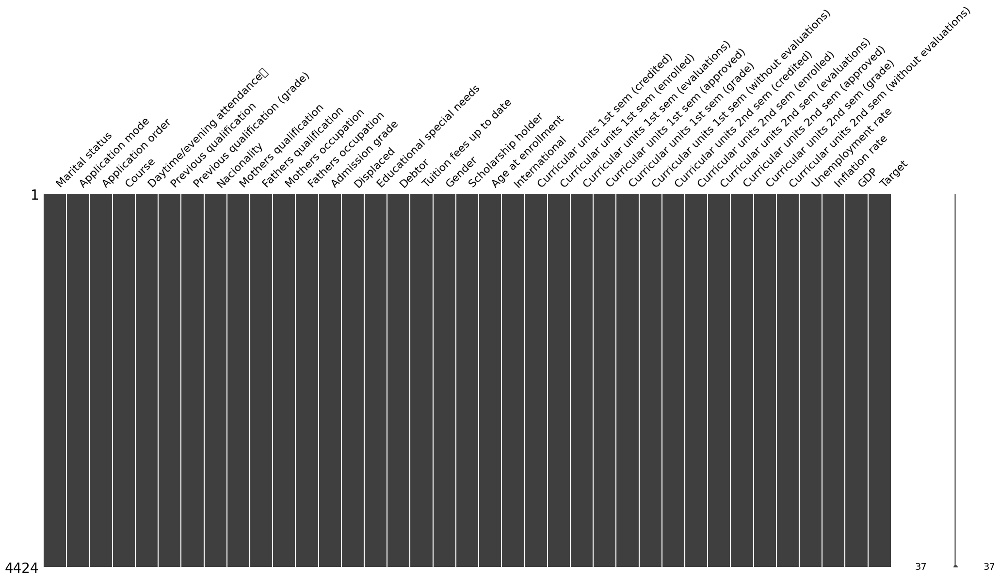

In [ ]:
col = list(dataset.columns)

atributos = dataset[col[:]]

# substituindo os zeros por NaN
#atributos.replace(0, np.nan, inplace=True)

# exibindo visualização matricial da nulidade do dataset
ms.matrix(atributos)

In [ ]:
dataset.isnull().sum()

,0
Marital status,0
Application mode,0
Application order,0
Course,0
Daytime/evening attendance\t,0
Previous qualification,0
Previous qualification (grade),0
Nacionality,0
Mothers qualification,0
Fathers qualification,0


A ausência de valores nulos e todos os atributos serem do tipo numérico, sugere que este dataset fora previamente tratado.

#### 3.1.4 Resumo estatístico

 Por fim, exibimos um resumo estatístico do dataset, apresentando as principais métricas: média, desvio padrão, valores mínimo/máximo e os quartis.



In [ ]:
# Faz um resumo estatístico do dataset (média, desvio padrão, mínimo, máximo e os quartis)
dataset.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,...,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,...,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


In [ ]:
dataset.min()

,0
Marital status,1
Application mode,1
Application order,0
Course,33
Daytime/evening attendance\t,0
Previous qualification,1
Previous qualification (grade),95.0
Nacionality,1
Mothers qualification,1
Fathers qualification,1


In [ ]:
dataset.max()

,0
Marital status,6
Application mode,57
Application order,9
Course,9991
Daytime/evening attendance\t,1
Previous qualification,43
Previous qualification (grade),190.0
Nacionality,109
Mothers qualification,44
Fathers qualification,44


In [ ]:
#Quantidade de linhas por colunas
dataset.count()

,0
Marital status,4424
Application mode,4424
Application order,4424
Course,4424
Daytime/evening attendance\t,4424
Previous qualification,4424
Previous qualification (grade),4424
Nacionality,4424
Mothers qualification,4424
Fathers qualification,4424


In [ ]:
colunasNumericas = ['Application order','Previous qualification (grade)','Admission grade','Age at enrollment',
                    'Curricular units 1st sem (credited)','Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)','Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)','Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)','Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)','Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)','Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP']
dataset[colunasNumericas].describe()

,Application order,Previous qualification (grade),Admission grade,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.727848,132.613314,126.978119,23.265145,0.709991,6.270570,8.299051,4.706600,10.640822,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,1.313793,13.188332,14.482001,7.587816,2.360507,2.480178,4.179106,3.094238,4.843663,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,0.000000,95.000000,95.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,125.000000,117.900000,19.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,133.100000,126.100000,20.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,2.000000,140.000000,134.800000,25.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,9.000000,190.000000,190.000000,70.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


No resumo estatístico das variáveis numéricas, podemos observar um possível outlier na coluna 'age at enrollment', cujo maior valor é 70 anos. Confirmaremos este possível outlier mais a frente, quando visualizarmos os gráficos boxplot.

In [ ]:
dataset.nunique()

,0
Marital status,6
Application mode,18
Application order,8
Course,17
Daytime/evening attendance\t,2
Previous qualification,17
Previous qualification (grade),101
Nacionality,21
Mothers qualification,29
Fathers qualification,34


#### 3.1.5 Balanceamento do Dataset

##### 3.1.5.1 Balanceamento das Classes (coluna Target)

Avaliando o balanceamento do dataset, medindo a distribuição das instâncias pelas classes graduated, enrollment e dropout (coluna Target).

In [ ]:
dataset.groupby('Target').size()

,0
Target,
Dropout,1421
Enrolled,794
Graduate,2209


Verificamos que o dataset tem as classes desbalanceadas. Possivelmente isto requererá posteriormente algum tratamento para que possamos tratar o desbalanceamento ou precisaremos de uma divisão treino/teste estratificada. Outro cenário seria transformar este problema de classificação ternária em um problema de classificação binária, transformando as classes Dropout e Enrolled em uma nova classe, chamada 'Not Graduated'. Neste cenário existirá um balanceamento entre as classes graduated e 'not graduated'.

Confirmamos abaixo o percentual do desbalanceamento e o visualizamos em um gráfico de barras.

In [ ]:
total=len(dataset)
num = pd.DataFrame(dataset.groupby('Target').size(),columns=['Quantidade'])

#percentual
percentual = round(num/total,2)
print(percentual.sort_values(by=['Quantidade'], ascending=False))

          Quantidade
Target              
Graduate        0.50
Dropout         0.32
Enrolled        0.18


In [ ]:
fig = px.histogram(dataset, x='Target',
                   color='Target')
fig.update_yaxes(title_text='Qtd. Instâncias por Classes')
fig.update_layout(title_text='Classes/Target')
fig.show()

Constatamos um dataset desbalanceado no que tange ao número de tuplas por classes.

##### 3.1.5.2 Criação de Recursos / Adição de Características

Adicionando características para melhor visualização do balanceamento dos estudantes por curso e nacionalidade.

In [ ]:
#Criando nova coluna CourseName, identificando o nome dos cursos
dataset.insert(5,'CourseName','nao informado',True)
dataset.insert(9,'NacionalidadeDescricao','nao informado',True)

In [ ]:
#Corrigindo nomes dos Cursos
dataset.loc[dataset['Nacionality'] == 1, 'NacionalidadeDescricao'] = 'Português'
dataset.loc[dataset['Nacionality'] == 2, 'NacionalidadeDescricao'] = 'Alemão'
dataset.loc[dataset['Nacionality'] == 6, 'NacionalidadeDescricao'] = 'Espanhol'
dataset.loc[dataset['Nacionality'] == 11, 'NacionalidadeDescricao'] = 'Italiano'
dataset.loc[dataset['Nacionality'] == 13, 'NacionalidadeDescricao'] = 'Holandês'
dataset.loc[dataset['Nacionality'] == 14, 'NacionalidadeDescricao'] = 'Inglês'
dataset.loc[dataset['Nacionality'] == 17, 'NacionalidadeDescricao'] = 'Lituano'
dataset.loc[dataset['Nacionality'] == 21, 'NacionalidadeDescricao'] = 'Angolano'
dataset.loc[dataset['Nacionality'] == 22, 'NacionalidadeDescricao'] = 'Cabo-verdiano'
dataset.loc[dataset['Nacionality'] == 24, 'NacionalidadeDescricao'] = 'Guineense'
dataset.loc[dataset['Nacionality'] == 25, 'NacionalidadeDescricao'] = 'Moçambicano'
dataset.loc[dataset['Nacionality'] == 26, 'NacionalidadeDescricao'] = 'Santomense'
dataset.loc[dataset['Nacionality'] == 32, 'NacionalidadeDescricao'] = 'Turco'
dataset.loc[dataset['Nacionality'] == 41, 'NacionalidadeDescricao'] = 'brasileiro'
dataset.loc[dataset['Nacionality'] == 62, 'NacionalidadeDescricao'] = 'romeno'
dataset.loc[dataset['Nacionality'] == 100, 'NacionalidadeDescricao'] = 'Moldávia (República da)'
dataset.loc[dataset['Nacionality'] == 101, 'NacionalidadeDescricao'] = 'Mexicano'
dataset.loc[dataset['Nacionality'] == 103, 'NacionalidadeDescricao'] = 'Ucraniano'
dataset.loc[dataset['Nacionality'] == 105, 'NacionalidadeDescricao'] = 'Russo'
dataset.loc[dataset['Nacionality'] == 108, 'NacionalidadeDescricao'] = 'Cubano'
dataset.loc[dataset['Nacionality'] == 109, 'NacionalidadeDescricao'] = 'Colombiano'

In [ ]:
#Corrigindo nomes dos Cursos
dataset.loc[dataset['Course'] == 9500, 'CourseName'] = 'Enfermagem'
dataset.loc[dataset['Course'] == 9147, 'CourseName'] = 'Gestão'
dataset.loc[dataset['Course'] == 9238, 'CourseName'] = 'Serviço Social'
dataset.loc[dataset['Course'] == 9085, 'CourseName'] = 'Enfermagem Veterinária'
dataset.loc[dataset['Course'] == 9773, 'CourseName'] = 'Jornalismo e Comunicação'
dataset.loc[dataset['Course'] == 9670, 'CourseName'] = 'Gestão de Publicidade e Marketing'
dataset.loc[dataset['Course'] == 9254, 'CourseName'] = 'Turismo'
dataset.loc[dataset['Course'] == 9991, 'CourseName'] = 'Gestão (atendimento noturno)'
dataset.loc[dataset['Course'] == 171, 'CourseName'] = 'Animação e Design Multimédia'
dataset.loc[dataset['Course'] == 9070, 'CourseName'] = 'Design de Comunicação'
dataset.loc[dataset['Course'] == 9003, 'CourseName'] = 'Agronomia'
dataset.loc[dataset['Course'] == 8014, 'CourseName'] = 'Serviço Social (atendimento noturno)'
dataset.loc[dataset['Course'] == 9119, 'CourseName'] = 'Engenharia Informática'
dataset.loc[dataset['Course'] == 9853, 'CourseName'] = 'Ensino Básico'
dataset.loc[dataset['Course'] == 9130, 'CourseName'] = 'Equinicultura'
dataset.loc[dataset['Course'] == 9556, 'CourseName'] = 'Higiene Oral'
dataset.loc[dataset['Course'] == 33, 'CourseName'] = 'Tecnologias de Produção de Biocombustíveis'

In [ ]:
dataset.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,Animação e Design Multimédia,1,122.0,1,Português,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,Turismo,1,160.0,1,Português,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,Design de Comunicação,1,122.0,1,Português,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,Jornalismo e Comunicação,1,122.0,1,Português,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,Serviço Social (atendimento noturno),1,100.0,1,Português,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


##### 3.1.5.3 Estudantes por curso

Analisando o balanceamento dos estudantes por curso

In [ ]:
#análise dos alunos por curso
total=len(dataset)
num_curso = pd.DataFrame(dataset.groupby('CourseName').size(),columns=['Quantidade'])

#percentual de alunos por curso
perc_curso = round(num_curso/total,2)
print(perc_curso.sort_values(by=['Quantidade'], ascending=False))

                                            Quantidade
CourseName                                            
Enfermagem                                        0.17
Gestão                                            0.09
Enfermagem Veterinária                            0.08
Serviço Social                                    0.08
Jornalismo e Comunicação                          0.07
Gestão (atendimento noturno)                      0.06
Gestão de Publicidade e Marketing                 0.06
Turismo                                           0.06
Agronomia                                         0.05
Design de Comunicação                             0.05
Serviço Social (atendimento noturno)              0.05
Animação e Design Multimédia                      0.05
Engenharia Informática                            0.04
Ensino Básico                                     0.04
Equinicultura                                     0.03
Higiene Oral                                      0.02
Tecnologia

In [ ]:
fig = px.histogram(dataset, x='CourseName',
                   color='CourseName',
                   height=1300)
fig.update_yaxes(title_text='num_curso')
fig.update_layout(title_text='Quantidade de estudantes por curso')
fig.show(height=1000)

##### 3.1.5.4 Estudantes por nacionalidade

Analisando o balanceamento dos estudantes por nacionalidade.

In [ ]:
#análise dos alunos por nacionalidade
total=len(dataset)
num_nacionalidades = pd.DataFrame(dataset.groupby('Nacionality').size(),columns=['Quantidade'])

#percentual de alunos por nacionalidade
perc_nacionalidades = round(num_nacionalidades/total,2)
print(perc_nacionalidades.sort_values(by=['Quantidade'], ascending=False))

             Quantidade
Nacionality            
1                  0.98
41                 0.01
2                  0.00
11                 0.00
6                  0.00
13                 0.00
14                 0.00
21                 0.00
17                 0.00
24                 0.00
25                 0.00
26                 0.00
22                 0.00
32                 0.00
62                 0.00
100                0.00
101                0.00
103                0.00
105                0.00
108                0.00
109                0.00


In [ ]:
fig = px.histogram(dataset, x='NacionalidadeDescricao',
                   color='NacionalidadeDescricao')
fig.update_yaxes(title_text='num_nacionalidades')
fig.update_layout(title_text='Quantidade de estudantes por nacionalidade')
fig.show()

Observamos que os dados nesta coluna estão extreamente desbalanceados com predomínio da nacionalidade portuguesa. Excluiremos a coluna 'Nacionality' para reduzir o número de características, visando melhor performance dos algoritmos, quando forem aplicados.

## 3.2. Visualizações Unimodais

Vamos analisar a distribuição de cada atributo do dataset, recorrendo aos diversos tipos de visualizações. O objetivo é verificar quais características possuem, por exemplo, distribuição exponencial, distribuição aproximadamente normal.

##### 3.2.1 Daytime/evening attendance

Removeremos a coluna Daytime/evening attendance\t , tendo em vista a predominância do dado de valor 1, conforme visualizado no gráfico de pizza abaixo.

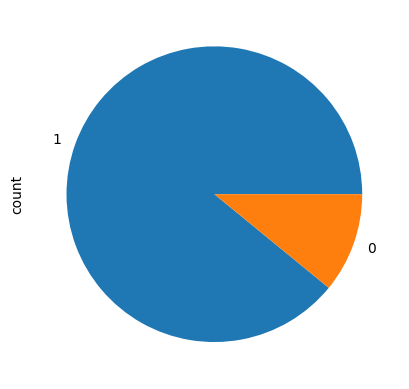

In [ ]:
dataset['Daytime/evening attendance\t'].value_counts().plot.pie();

##### 3.2.1 International

Removeremos a coluna international, tendo em vista a predominância do dado de valor 1.

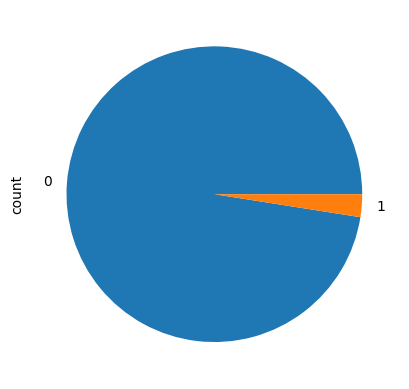

In [ ]:
dataset['International'].value_counts().plot.pie();

Identificamos distribuições normais, aproximadamente normais, exponenciais, aproximadamente exponenciais e distorcidas para os atributos. Para tais casos, uma transformação como a Box-Cox, que pode aproximar a distribuição de uma Normal, é recomendada.

### 3.2.2 Gráficos Boxplot (Bigode) das colunas numéricas

Visualizaremos os gráficos boxplots das colunas numéricas 'Application order', 'Previous qualification (grade)', 'Admission grade', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)', 'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate' e 'GDP' em busca da identificação de possíveis valores outliers.

No **boxblot**, a linha no centro representa o valor da mediana (segundo quartil ou p50). A linha abaixo é o 1o quartil (p25) e a linha acima o terceiro quartil (p75). O boxplot ajuda a ter uma ideia da dispersão dos atributos do dataset e os possíveis outliers.


In [ ]:
colunasNumericas

['Application order',
 'Previous qualification (grade)',
 'Admission grade',
 'Age at enrollment',
 'Curricular units 1st sem (credited)',
 'Curricular units 1st sem (enrolled)',
 'Curricular units 1st sem (evaluations)',
 'Curricular units 1st sem (approved)',
 'Curricular units 1st sem (grade)',
 'Curricular units 1st sem (without evaluations)',
 'Curricular units 2nd sem (credited)',
 'Curricular units 2nd sem (enrolled)',
 'Curricular units 2nd sem (evaluations)',
 'Curricular units 2nd sem (approved)',
 'Curricular units 2nd sem (grade)',
 'Curricular units 2nd sem (without evaluations)',
 'Unemployment rate',
 'Inflation rate',
 'GDP']

#### 3.2.2.1 Boxplot da coluna Application order


In [ ]:
plotarBoxplot(dataset, 'Application order')

Checando se há nota de qualificação prévia maior que 200

In [ ]:
dataset[dataset['Application order'] > 9]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


#### 3.2.2.2 Boxplot da coluna Previous qualification (grade)

In [ ]:
plotarBoxplot(dataset, 'Previous qualification (grade)')

Checando se há nota de qualificação prévia maior que 200

#### 3.2.2.3 Boxplot da coluna Admission grade

In [ ]:
plotarBoxplot(dataset, 'Admission grade')

#### 3.2.2.4 Boxplot da coluna Age of enrollment

In [ ]:
plotarBoxplot(dataset, 'Age at enrollment')

#### 3.2.2.5 Boxplot da coluna
Curricular units 1st sem (credited)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (credited)')

#### 3.2.2.6 Boxplot da coluna Curricular units 1st sem (enrolled)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (enrolled)')

#### 3.2.2.7 Boxplot da coluna Curricular units 1st sem (evaluations)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (evaluations)')

#### 3.2.2.8 Boxplot da coluna Curricular units 1st sem (approved)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (approved)')

#### 3.2.2.9 Boxplot da coluna Curricular units 1st sem (grade)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (grade)')

Checando se existem valores maiores que 20

#### 3.2.2.10 Boxplot da coluna Curricular units 1st sem (without evaluations)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 1st sem (without evaluations)')

#### 3.2.2.11 Boxplot da coluna Curricular units 2nd sem (credited)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (credited)')

#### 3.2.2.12 Boxplot da coluna Curricular units 2nd sem (enrolled)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (enrolled)')

#### 3.2.2.13 Boxplot da coluna Curricular units 2nd sem (evaluations)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (evaluations)')

#### 3.2.2.14 Boxplot da coluna Curricular units 2nd sem (approved)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (approved)')

#### 3.2.2.15 Boxplot da coluna Curricular units 2nd sem (grade)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (grade)')

Checando se existem valores maiores que 20

In [ ]:
dataset[dataset['Curricular units 2nd sem (grade)'] > 20]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


#### 3.2.2.16 Boxplot da coluna Curricular units 2nd sem (without evaluations)

In [ ]:
plotarBoxplot(dataset, 'Curricular units 2nd sem (without evaluations)')

#### 3.2.2.17 Boxplot da coluna Unemployment rate

In [ ]:
plotarBoxplot(dataset, 'Unemployment rate')

#### 3.2.2.18 Boxplot da coluna Inflation rate

In [ ]:
plotarBoxplot(dataset, 'Inflation rate')

#### 3.2.2.19 Boxplot da coluna GDP

In [ ]:
plotarBoxplot(dataset,'GDP');

## 3.3 Dispersão dos dados

In [ ]:
#pair plot com seaborn
sns.pairplot(dataset)

## 3.4 Distribuição de Frequências

### 3.4.1 Previous qualification (grade)

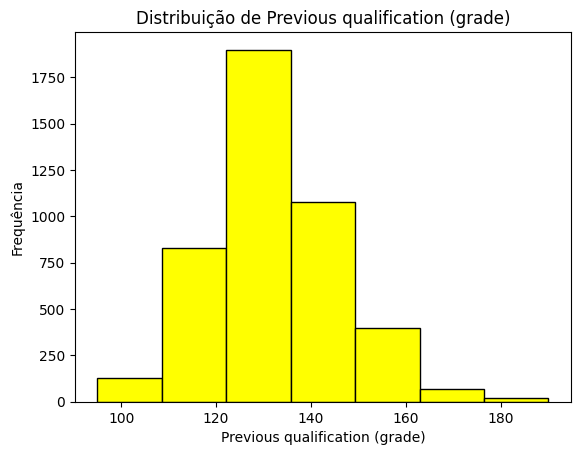

In [ ]:
#Histograma
plotarHistograma(dataset['Previous qualification (grade)'],'Previous qualification (grade)')

Distribuição aproximadamente normal.

### 3.4.2 Admission grade

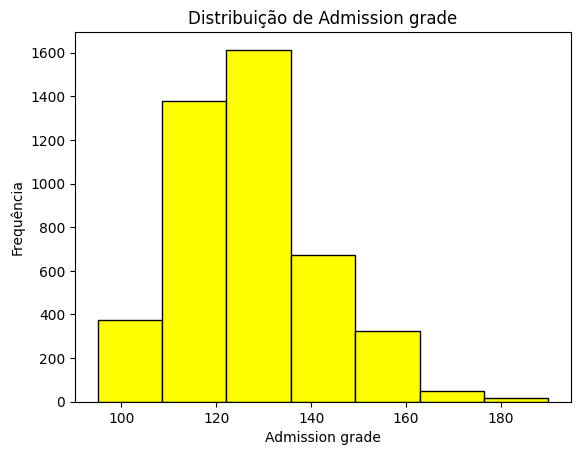

In [ ]:
#Histograma
plotarHistograma(dataset['Admission grade'],'Admission grade')

Distribuição aproximadamente normal

### 3.4.3 Age at enrollment

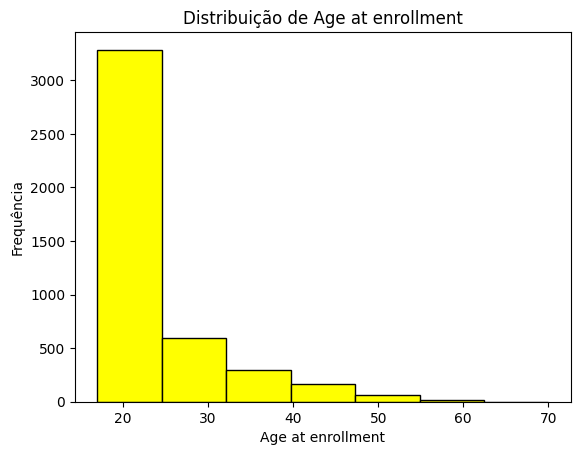

In [ ]:
#Histograma
plotarHistograma(dataset['Age at enrollment'],'Age at enrollment')

Distribuição exponencial

### 3.4.4 Curricular units 1st sem (credited)

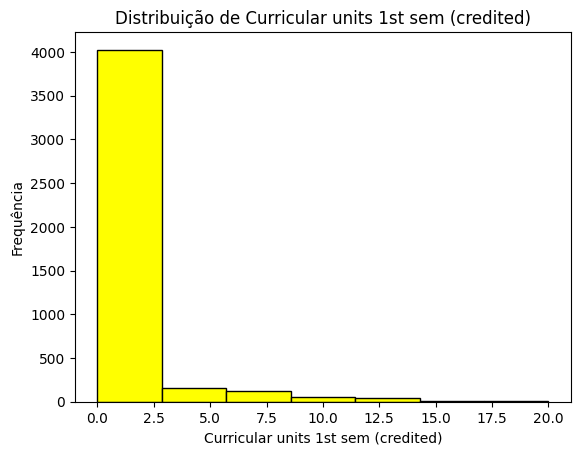

In [ ]:
#Histograma
plotarHistograma(dataset['Curricular units 1st sem (credited)'], 'Curricular units 1st sem (credited)');

Distribuição exponencial

### 3.4.5 Curricular units 1st sem (enrolled)

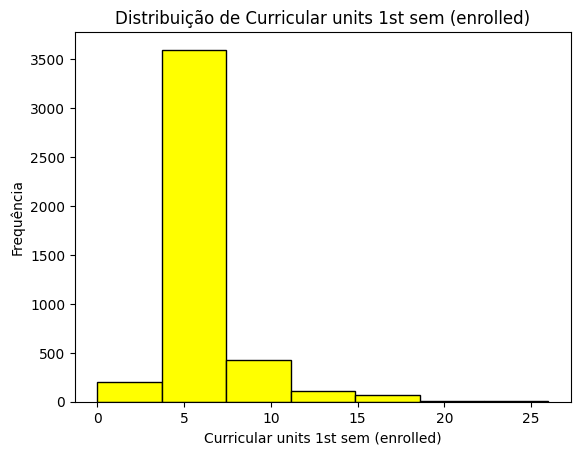

In [ ]:
#Histograma
plotarHistograma(dataset['Curricular units 1st sem (enrolled)'], 'Curricular units 1st sem (enrolled)');

Distribuição com a predominância de uma faixa de valores.

### 3.4.6 Curricular units 1st sem (evaluations)

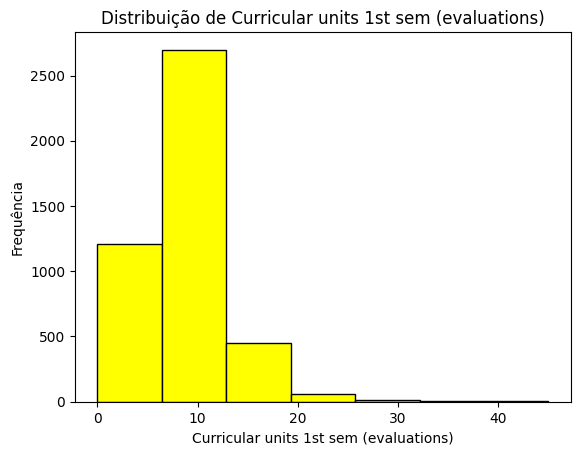

In [ ]:
#Histograma
plotarHistograma(dataset['Curricular units 1st sem (evaluations)'], 'Curricular units 1st sem (evaluations)');



Distribuição com a predominância de uma faixa de valores.

### 3.4.7 Curricular units 1st sem (approved)

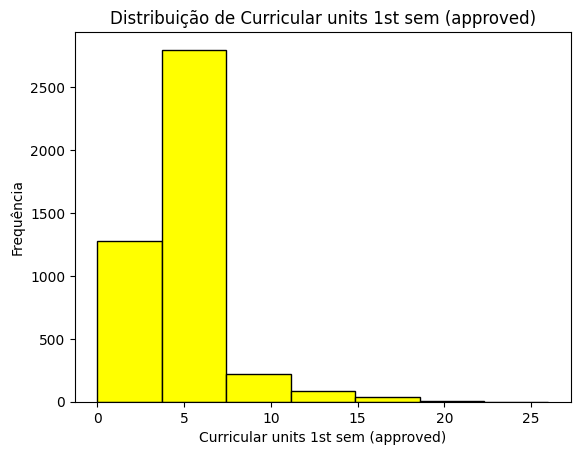

In [ ]:
plotarHistograma(dataset['Curricular units 1st sem (approved)'],'Curricular units 1st sem (approved)')

Distribuição com a predominância de uma faixa de valores.

### 3.4.8 Curricular units 1st sem (grade)

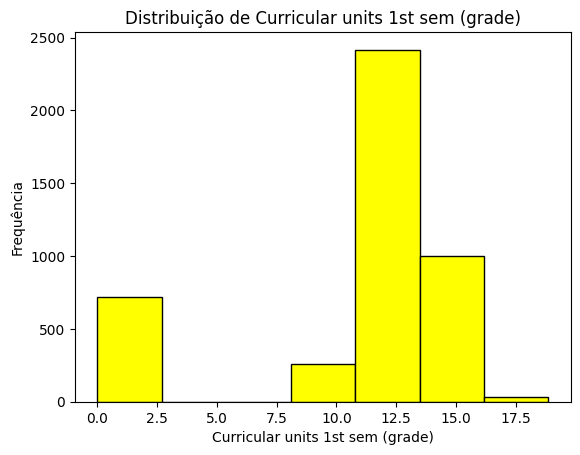

In [ ]:
plotarHistograma(dataset['Curricular units 1st sem (grade)'],'Curricular units 1st sem (grade)')

Distribuição distorcida.

### 3.4.9 Curricular units 1st sem (without evaluations)

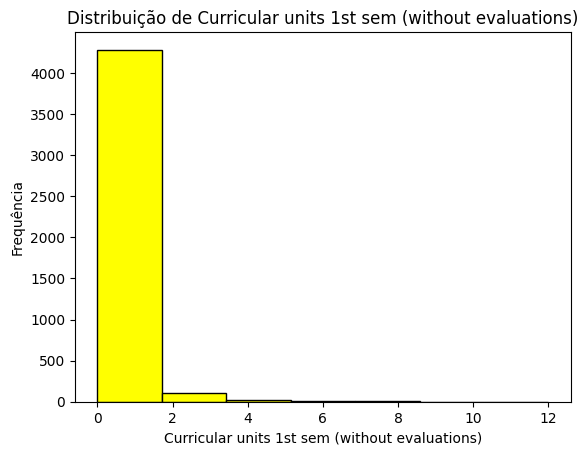

In [ ]:
plotarHistograma(dataset['Curricular units 1st sem (without evaluations)'],'Curricular units 1st sem (without evaluations)')

Distribuição exponencial.

### 3.4.10 Curricular units 2nd sem (credited)

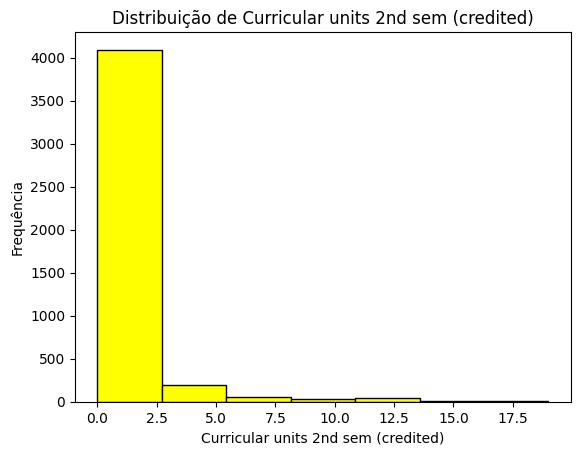

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (credited)'],'Curricular units 2nd sem (credited)')

Distribuição exponencial

### 3.4.11 Curricular units 2nd sem (enrolled)

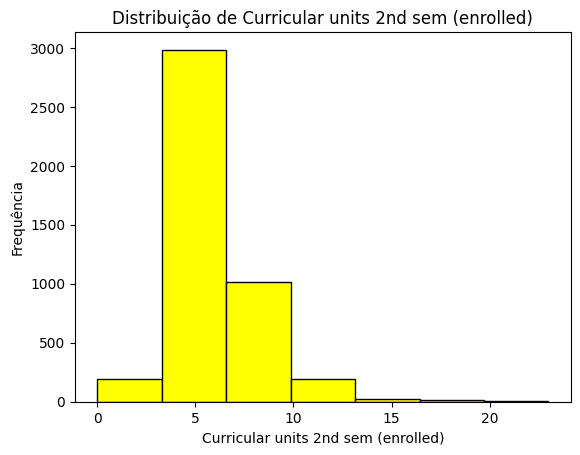

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (enrolled)'],'Curricular units 2nd sem (enrolled)')

Distribuição aproximadamente normal.

### 3.4.12 Curricular units 2nd sem (evaluations)


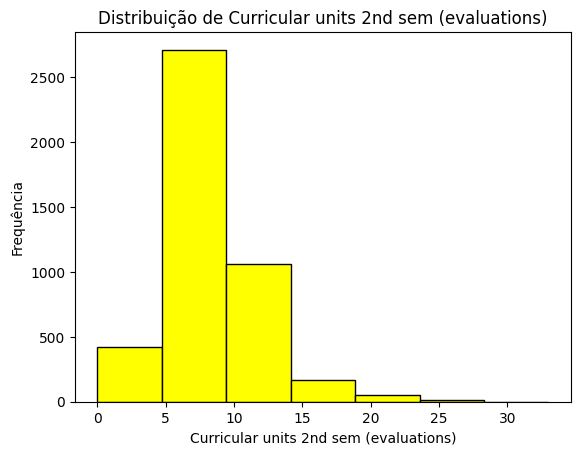

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (evaluations)'],'Curricular units 2nd sem (evaluations)')

Distribuição aproximadamente normal.

### 3.4.13 Curricular units 2nd sem (approved)

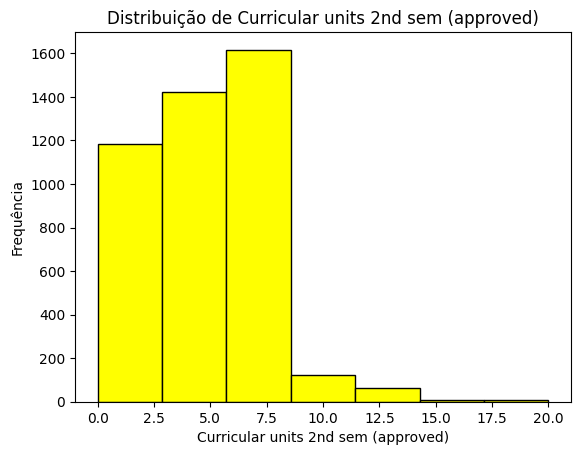

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (approved)'],'Curricular units 2nd sem (approved)')

Distribuição distorcida.

### 3.4.14 Curricular units 2nd sem (grade)

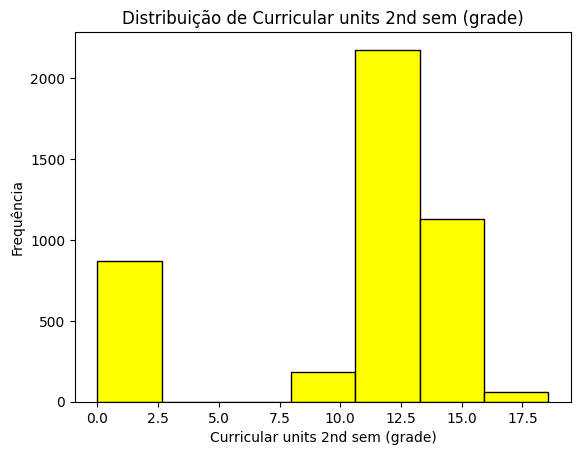

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (grade)'],'Curricular units 2nd sem (grade)')

Distribuição distorcida.

### 3.4.15 Curricular units 2nd sem (without evaluations)

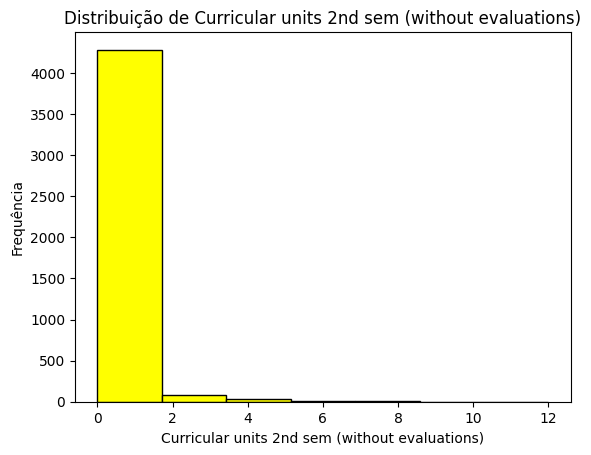

In [ ]:
plotarHistograma(dataset['Curricular units 2nd sem (without evaluations)'],'Curricular units 2nd sem (without evaluations)')

Distribuição exponencial.

### 3.4.16 Unemployment rate

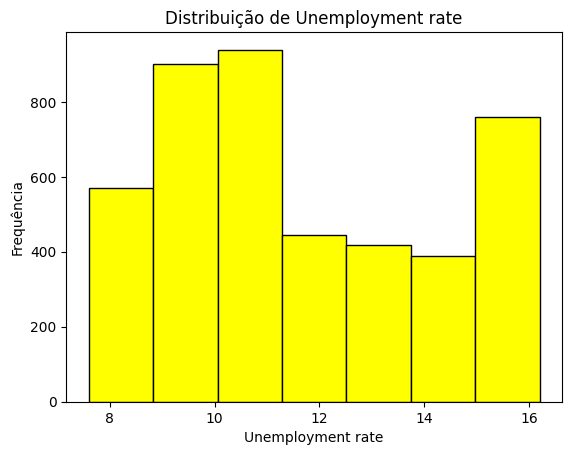

In [ ]:
plotarHistograma(dataset['Unemployment rate'],'Unemployment rate')

Disribição normal com dois grupos emparelhados.

## 3.5 Visualizações Multimodais

Ao visualizar as correlações entre os atributos através da matriz de correlação, perceberemos que parece haver alguma estrutura na ordem dos atributos. O azul ao redor da diagonal sugere que os atributos que estão próximos um do outro são geralmente mais correlacionados entre si. Os vermelhos também sugerem alguma correlação negativa moderada.

Vamos agora verificar a covariância entre as variáveis numéricas do dataset. A **covariância** representa como duas variáveis numéricas estão relacionadas. Existem várias formas de calcular a correlação entre duas variáveis, como por exemplo, o coeficiente de correlação de Pearson, que pode ser:
* Próximo de -1 : há uma correlação negativa entre as variáveis,
* Próximo de +1: há uma correlação positiva entre as variáveis.
* 0: não há correlação entre as variáveis.

Eliminar a correlação entre as variáveis é fundamental para o bom funcionamento de alguns modelos, como, por exemplo, regressão linear e regressão logística. Estes podem apresentar problemas de performance se houver atributos altamente correlacionados.

Falamos anteriormente da importância da correlação entre os atributos, e agora iremos visualizar esta informação em formato gráfico. A **matriz de correlação** exibe graficamente a correlação entre os atributos numéricos do dataset.

### 3.5.1 Correlação das Características

Avaliaremos a  exisência de correlação entre as variáveis, visando eliminá-las , se possível, e  reduzir o número de características.

Colunas do tipo cadeia de caracteres (String) removidas, pois o estudo de correlação não se aplica nas mesmas.

In [ ]:
datasetEstudoCorrelacao = datasetCompleto[['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother''s qualification', 'Father''s qualification',
       'Mother''s occupation', 'Father''s occupation',
       'Admission grade', 'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP']]

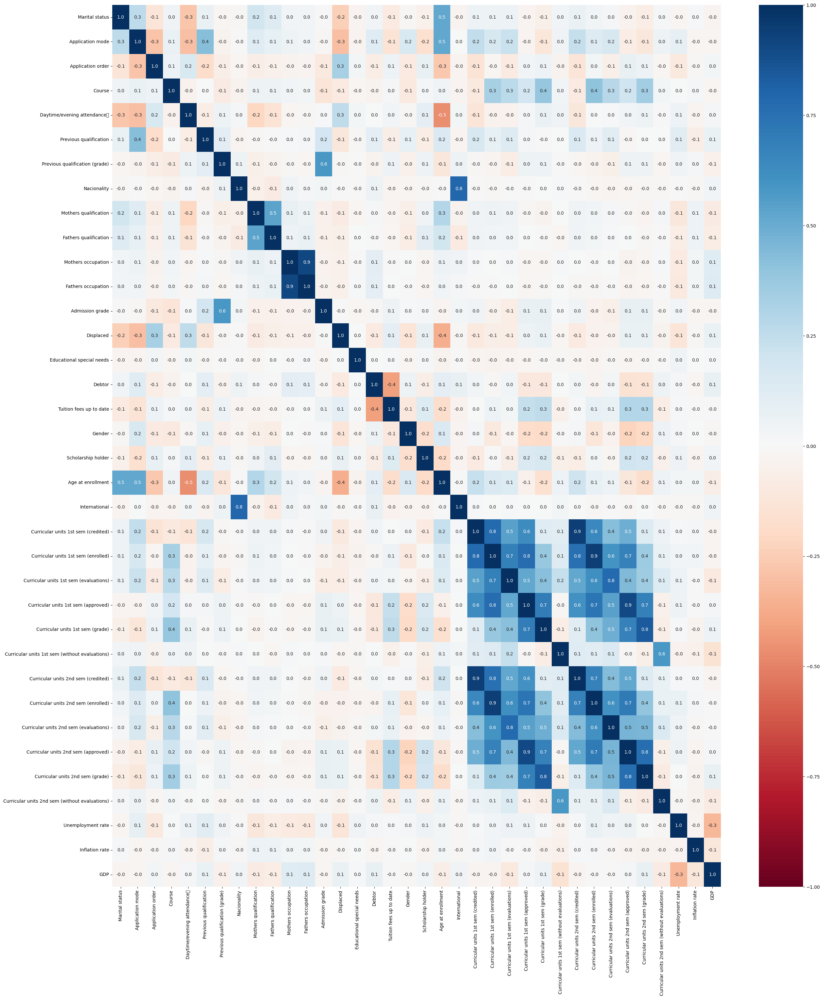

In [ ]:
fig = plt.subplots(figsize = (30,35))
sns.heatmap(data = datasetEstudoCorrelacao.corr(), annot=True, vmin=-1, vmax=1, cmap='RdBu',fmt='.1f')
#sns.heatmap(data = dataset.corr(), annot=True, vmin=-1, vmax=1, cmap='RdBu')
plt.show()

A análise da correlação das variáveis indica ala correlação entre as características abaixo:

*   Marital status:
  0.52 com Age at enrollment.
*   Application mode:
  0.52 com Age at enrollment;
  0.42 com Previous Qualification.
*   Course:
  0.4 com Curricular units 2nd sem (enrolled).
*   Daytime/evening attendance\t:
  -0.46 com Age at enrollment.
*   Previous qualification:
  0.42 com Application mode.
*   Previous qualification (grade):
  0.58 com Admission grade.
*   Nacionality:
  0.79 com International.
*   Mothers qualification:
  0.54 com Fathers qualification.
*   Fathers qualification:
  0.54 com Mothers qualification.
*   Mother's occupation:
  0.91 com Father's occupation.
*   Father's occupation:
  0.91 com Mother's occupation.
*   Admission grade:
  0.58 com Previous qualification (grade).
*   Debtor:
  -0.41 com Tuition fees up to date.
*   Tuition fees up to date:
  -0.41 com Debtor.
*   Age at enrollment:
  0.52 com Marital status;
  0.52 com Application mode;
  -0.46 com Daytime/evening attendance\t.
*   International:
  0.79 com Nacionality.
*   Curricular units 1st sem (credited):
  0.77 com Curricular units 1st sem (enrolled);
  0.54 com Curricular units 1st sem (evaluations);
  0.63 com Curricular units 1st sem (approved).
*   Curricular units 1st sem (enrolled)
  0.77 com Curricular units 1st sem (credited);
  0.68 com Curricular units 1st sem (evaluations);
  0.77 com Curricular units 1st sem (approved);
  0.38 com Curricular units 1st sem (grade).
*   Curricular units 1st sem (evaluations)
  0.54 com Curricular units 1st sem (credited);
  0.68 com Curricular units 1st sem (enrolled);
  0.52 com Curricular units 1st sem (approved);
  0.42 com Curricular units 1st sem (grade).
*   Curricular units 1st sem (approved)
  0.63 com Curricular units 1st sem (credited);
  0.77 com Curricular units 1st sem (enrolled);
  0.52 com Curricular units 1st sem (evaluations);
  0.7 com Curricular units 1st sem (grade);
  0.61 com Curricular units 2nd sem (credited).
*   Curricular units 1st sem (grade)
  0.38 com Curricular units 1st sem (enrolled);
  0.42 com Curricular units 1st sem (evaluations);
  0.7 com Curricular units 1st sem (approved).
*   Curricular units 1st sem (without evaluations):
  0.58 com Curricular units 2st sem (without evaluations).
*   Curricular units 2nd sem (credited):
  0.94 com Curricular units 1st sem (credited);
  0.75 com Curricular units 1st sem (enrolled);
  0.52 com Curricular units 1st sem (evaluations);
  0.61 com Curricular units 1st sem (approved);
  0.68 com Curricular units 2nd sem (enrolled);
  0.43 com Curricular units 2nd sem (evaluations);
  0.52 com Curricular units 2nd sem (approved).
*   Curricular units 2nd sem (enrolled):
  0.64 com Curricular units 1st sem (credited);
  0.94 com Curricular units 1st sem (enrolled);
  0.61 com Curricular units 1st sem (evaluations);
  0.73 com Curricular units 1st sem (approved);
  0.41 com Curricular units 1st sem (grade);
  0.68 com Curricular units 2nd sem (credited);
  0.6 com Curricular units 2nd sem (evaluations);
  0.7 com Curricular units 2nd sem (approved);
  0.4 com Curricular units 2nd sem (grade);
  0.4 com Course.
*   Curricular units 2nd sem (evaluations):
  0.43 com Curricular units 1st sem (credited);
  0.6 com Curricular units 1st sem (enrolled);
  0.78 com Curricular units 1st sem (evaluations);
  0.54 com Curricular units 1st sem (approved);
  0.49 com Curricular units 1st sem (grade);
  0.43 com Curricular units 2nd sem (credited);
  0.6 com Curricular units 2nd sem (enrolled);
  0.46 com Curricular units 2nd sem (approved);
  0.45 com Curricular units 2nd sem (grade).
*   Curricular units 2nd sem (approved):
  0.49 com Curricular units 1st sem (credited);
  0.67 com Curricular units 1st sem (enrolled);
  0.44 com Curricular units 1st sem (evaluations);
  0.9 com Curricular units 1st sem (approved);
  0.67 com Curricular units 1st sem (grade);
  0.52 com Curricular units 2nd sem (credited);
  0.7 com Curricular units 2nd sem (enrolled);
  0.46 com Curricular units 2nd sem (evaluations);
  0.76 com Curricular units 2nd sem (grade).
*   Curricular units 2nd sem (grade):
  0.69 com Curricular units 1st sem (approved);
  0.84 com Curricular units 1st sem (grade);
  0.4 com Curricular units 2nd sem (enrolled);
  0.45 com Curricular units 2nd sem (evaluations);
  0.76 com Curricular units 2nd sem (approved).
*   Curricular units 2nd sem (without evaluations):
      0.58 com Curricular units 1st sem (without evaluations).



## 3.6 Conclusão da Análise Exploratória

Ao final desta etapa o objetivo é montar um guia das ações necessárias para obermos um dataset limpo e com os dados que serão relevantes para análise dos modelos.



Uma vez encerrada a análise exploratória, concluímos que:
<p> - não há necessidade de tratamento de dados nulos;
eliminar outlier idade 70 anos da coluna 'age enrollment';
<p> - As colunas numéricas e as categóricas, transformadas em numéricas, possuemm escalas diferentes. Isto pode prejudicar os algoritmos, logo será necessário igualar as escalas das colunas em questão;
<p> - Excluir as colunas 'Nacionality' e International, pois um mesmo dados predomina quase que na tottalidade das linhas;
<p> - Remover colunas com alto grau de correlação, acima de 0,4;
<p> - eliminar duplicidades nas colunas "Father's ocuppation" e "Mother's ocuppation".

## 4 Pré-processamento de Dados

Nesta etapa realizaremos diversas operações de tratamento, limpeza e melhoria da qualidade dos dados, visando a obtenção dos melhores resultados dos modelos de machine learning futuramente aplicados.

### 4.1 Eliminando duplicidades

Alteraremos o código 3 pelo código 2 nas colunas Mother's qualification e Father's qualification . Aenas o código 2 representará a qualificação "Ensino superior - Licenciatura".

In [ ]:
dataset.loc[dataset['Mother''s qualification'] == 3]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
18,1,1,1,9130,1,Equinicultura,1,137.0,1,Português,...,0,5,8,4,12.250000,2,10.8,1.4,1.74,Graduate
29,1,17,2,9500,1,Enfermagem,1,127.0,1,Português,...,0,7,7,6,13.716667,0,16.2,0.3,-0.92,Enrolled
40,1,1,5,9773,1,Jornalismo e Comunicação,1,126.0,1,Português,...,0,5,5,0,0.000000,0,12.7,3.7,-1.70,Dropout
41,1,1,2,9147,1,Gestão,1,133.0,1,Português,...,0,5,5,5,15.800000,0,8.9,1.4,3.51,Graduate
57,1,39,1,9130,1,Equinicultura,40,129.0,1,Português,...,5,11,13,10,12.900000,0,12.4,0.5,1.79,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4361,1,17,1,9500,1,Enfermagem,1,145.0,1,Português,...,0,8,8,8,13.347500,0,9.4,-0.8,-3.12,Graduate
4366,1,1,1,9670,1,Gestão de Publicidade e Marketing,1,127.0,1,Português,...,0,6,11,4,14.000000,0,12.4,0.5,1.79,Graduate
4397,1,5,4,9853,1,Ensino Básico,1,116.0,1,Português,...,0,6,9,3,11.666667,0,9.4,-0.8,-3.12,Enrolled
4414,1,1,1,9130,1,Equinicultura,1,137.0,1,Português,...,0,5,8,5,11.600000,0,9.4,-0.8,-3.12,Graduate


In [ ]:
dataset.loc[dataset['Father''s qualification'] == 3]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
1,1,15,1,9254,1,Turismo,1,160.0,1,Português,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
29,1,17,2,9500,1,Enfermagem,1,127.0,1,Português,...,0,7,7,6,13.716667,0,16.2,0.3,-0.92,Enrolled
31,1,51,1,9070,1,Design de Comunicação,1,125.0,1,Português,...,0,6,9,4,13.400000,0,8.9,1.4,3.51,Graduate
40,1,1,5,9773,1,Jornalismo e Comunicação,1,126.0,1,Português,...,0,5,5,0,0.000000,0,12.7,3.7,-1.70,Dropout
42,1,1,6,9500,1,Enfermagem,1,103.0,1,Português,...,0,8,9,7,14.342857,0,11.1,0.6,2.02,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,1,1,1,9254,1,Turismo,1,125.0,1,Português,...,0,6,14,2,12.500000,0,10.8,1.4,1.74,Dropout
4316,1,1,3,9070,1,Design de Comunicação,1,118.0,1,Português,...,0,6,7,6,13.571429,0,8.9,1.4,3.51,Graduate
4340,1,17,1,9085,1,Enfermagem Veterinária,1,120.0,1,Português,...,0,5,11,4,11.500000,1,9.4,-0.8,-3.12,Graduate
4361,1,17,1,9500,1,Enfermagem,1,145.0,1,Português,...,0,8,8,8,13.347500,0,9.4,-0.8,-3.12,Graduate


In [ ]:
dataset.loc[dataset['Mother''s qualification'] == 3, 'Mother''s qualification'] = 2
dataset.loc[dataset['Father''s qualification'] == 3, 'Father''s qualification'] = 2

In [ ]:
dataset.loc[dataset['Mother''s qualification'] == 3]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


In [ ]:
dataset.loc[dataset['Father''s qualification'] == 3]

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,CourseName,Previous qualification,Previous qualification (grade),Nacionality,NacionalidadeDescricao,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


Duplicidades eliminadas.

###4.2 Tratamento de Outliers

Como não há idade para começar a estudar, não eliminaremos o dado idade de inscrição 76 anos.

###4.3 Tratamento de Dados Inválidos

Um outro problema que pode existir em bases de dados são os dados inválidos, que são dados preenchidos, porém o conteúdo pode representar um erro de gravação. Não foram encontrados valores inválidos para tratamento.

###4.4 Seleção de Características

Colunas desbalanceadas e com alto grau de correlação serão removidas neste passo. Algoritmos de machile learning costumam apresentar melhores resultados, quando trabalham com poucos atributos.

#### 4.4.1 Exclusão de atributos

Neste passo excluiremos as colunas , tendo em vista o alto grau de correlação, levantado na análise exploratória. Também serão removidas colunas desbalanceadas.

In [ ]:
#Colunas com alto grau de correlação
dataset.drop('Marital status', axis=1, inplace=True)
dataset.drop('Application mode', axis=1, inplace=True)
dataset.drop('Daytime/evening attendance\t', axis=1, inplace=True)
dataset.drop('Previous qualification (grade)', axis=1, inplace=True)
dataset.drop('Mother''s qualification', axis=1, inplace=True)
dataset.drop('Father''s occupation', axis=1, inplace=True)
dataset.drop('Tuition fees up to date', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (credited)', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (enrolled)', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (evaluations)', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (approved)', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (grade)', axis=1, inplace=True)
dataset.drop('Curricular units 2nd sem (credited)', axis=1, inplace=True)
dataset.drop('Curricular units 2nd sem (enrolled)', axis=1, inplace=True)
dataset.drop('Curricular units 2nd sem (evaluations)', axis=1, inplace=True)
dataset.drop('Curricular units 2nd sem (grade)', axis=1, inplace=True)
dataset.drop('Curricular units 1st sem (without evaluations)', axis=1, inplace=True)

#Colunas desbalanceadas
dataset.drop('Nacionality', axis=1, inplace=True)
dataset.drop('International', axis=1, inplace=True)

#Colunas adicionadas na análise exploratória para enriquecer as visualizações
#dataset.drop('CourseName', axis=1, inplace=True)
#dataset.drop('NacionalidadeDescricao', axis=1, inplace=True)
dataset = dataset.drop('CourseName', axis=1, inplace=False)
dataset = dataset.drop('NacionalidadeDescricao', axis=1, inplace=False)

In [ ]:
dataset.shape

(4424, 18)

Este passo reduziu o número de características de 36 para 18. Segue a recomendação de entender via algoritmo, quais as colunas mais importantes para os modelos atingirem seus melhores resultados.

### **4.5** Particionando Dataset (treino e teste)

Antes de normalizarmos o dataset no próximo passo, precisamos dividi-lo em duas partes: treino e teste. Isto evitará o data leakage (vazamento de dados, que ocorre quando parte dos dados de teste são conhecidos pelos dados de treino).

É uma boa prática usar um conjunto de teste (conjunto de validação), uma amostra dos dados que não será usada para a construção do modelo, mas somente no fim do projeto para confirmar a precisão do modelo final. É um teste que podemos usar para verificar o quão boa foi a construção do modelo, e para nos dar uma ideia de como o modelo irá performar nas estimativas em dados não vistos. Usaremos 80% do conjunto de dados para modelagem e guardaremos 20% para teste, usando a estratégia train-test-split.Primeiramente, iremos sinalizar quais são as colunas de atributos e qual é a coluna das classes. Em seguida, especificaremos o tamanho do conjunto de teste desejado e uma semente (para garantir a reprodutibilidade dos resultados). Finalmente, faremos a separação dos conjuntos de treino e teste através do comando train_test_split, que retornará 4 estruturas de dados: os atributos e classes para o conjunto de teste e os atributos e classes para o conjunto de treino.


In [ ]:
#Parametrização para a divisão do Dataset em treino e teste
# Definição da proporção do conjunto de teste
test_size = 0.20
seed = 7
# Semente para reprodutibilidade do projeto, kfolds e scoring
np.random.seed(seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

# Criando os folds para a validação cruzada
# número de folds da validação cruzada
num_particoes = 10
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=seed) # faz o particionamento em 10 folds

O particionamento, propriamente dito, foi movido para a próxima seção, "Treinando os Modelos", tendo em vista as diversas versões de bases de dados testadas.

### 4.6 Transformações Box-Cox, Padronização e Normalização

Tais operações serão realizadas tanto no conjunto de treino, como no conjunto de teste, respeitando as mesmas escalas de cada processo em ambos os conjuntos de dados.

Quando aplicarmos a transformação Normalização, conforme sugerido na Análise Exploratória, igualaremos as escalas das colunas: valor mínimo 0 (zero) e valor máximo 1 (um).

Por fim, deve-se salvar uma cópia do dataset após o término da execução de cada transformação sugerida neste passo. Havendo tempo hábil, o ideal é submeter as diversas versões transformadas do dataset

# 5 Treinando os Modelos

Após análise dos dados, tratamento de valores duplicados, missings, inválidos, outliers e correlacionados, chegamos na etapa final que será a  análise de diferentes algoritmos em diferentes bases: dados sem tratamento e dados pré-processados. Serão analisadas versões com os dados originais, normalizados e padronizados. A intenção e que com estas formatações seja possível alcançar melhores resultados. Tendo em vista o problema de distribuição dos dados entre as 3 classes originais, também trabalharemos o conjunto de dados, como um problema de classificação binária.

##5.1 Base completa

Inicialmente trabalharemos com a base de dados original sem tratamento. Mediremos qual a acurácia mínima esperada após treinarmos os modelos. A base completa reúne 36 características dos alunos, além da respectiva classe original.

O modelo dummy é um balisador mínimo, que temos como referência para testar a performance dos modelos. Para o estudo temos o resultado de 50% no modelo dummy, logo esperamos resultados melhores que este.

Dropout   0.32
Enrolled  0.18
Graduate  0.50

In [ ]:
datasetCompleto.shape

(4424, 37)

In [ ]:
# modelo dummy
total=len(datasetCompleto['Target'])
num = pd.DataFrame(datasetCompleto.groupby('Target').size(),columns=['%'])
perc = round(num/total,2)
print(perc)

             %
Target        
Dropout   0.32
Enrolled  0.18
Graduate  0.50


Particionando a base completa em treino e teste.

In [ ]:
# Separação em conjuntos de treino e teste (dataset original)
# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = datasetCompleto.values
# Separação das variáveis preditoras e da variável target
X = array[:,0:36]
y = array[:,36]
#X_train, X_test, y_train, y_test = train_test_split(X, y,
#    test_size=test_size, shuffle=True, random_state=seed) # sem estratificação
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=test_size, shuffle=True, random_state=seed, stratify=y) # com estratificação

Treinando a base completa.

LR: 0.688901 (0.021268)
KNN: 0.591967 (0.025781)
CART: 0.682099 (0.031703)
NB: 0.686352 (0.021846)
SVM: 0.499294 (0.015124)
PadrLR: 0.760373 (0.019847)
PadrKNN: 0.692564 (0.016927)
PadrCART: 0.686337 (0.035102)
PadrNB: 0.684090 (0.021160)
PadrSVM: 0.760662 (0.021834)
NormLR: 0.758399 (0.019389)
NormKNN: 0.671090 (0.024964)
NormCART: 0.684930 (0.035176)
NormNB: 0.684090 (0.021160)
NormSVM: 0.750775 (0.018232)


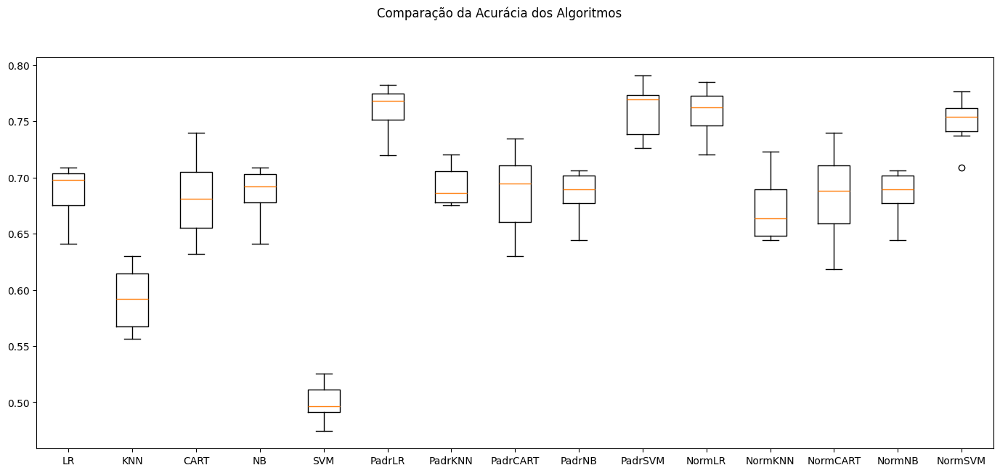

In [ ]:
# Pipelines do dataset e aplicação do modelo
models = []
bases = []
pipelines = []
results = []
names = []

#Ensembles e bases estimators
# definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3


# dados brutos
pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
pipelines.append(('SVM', Pipeline([('SVM', SVC())])))

# dados padronizados
pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))

# dados normalizados
pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))

# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

# boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Resultado do treinamento da base completa:

* LR: 0.688901 (0.021268)
* KNN: 0.591967 (0.025781)
* CART: 0.682099 (0.031703)
* NB: 0.686352 (0.021846)
* SVM: 0.499294 (0.015124)
* **PadrLR: 0.760373 (0.019847)**
* PadrKNN: 0.692564 (0.016927)
* PadrCART: 0.686337 (0.035102)
* PadrNB: 0.684090 (0.021160)
* **=> PadrSVM: 0.760662 (0.021834) <=**
* **NormLR: 0.758399 (0.019389)**
* NormKNN: 0.671090 (0.024964)
* NormCART: 0.684930 (0.035176)
* NormNB: 0.684090 (0.021160)
* NormSVM: 0.750775 (0.018232)

Os algoritmos SVM e Regressão Logística apresentaram os melhores índices de acurácia, quando treinados com o dataset completo padronizado: 0.760662 (0.021834) e 0.760373 (0.019847) respectivamente. Satisfatoriamente, os primeiros modelos treinados já apresentam acurácia acima da mínima desejada.

##5.2 Base pré-processada

Em busca de modelos com melhores acurácias, trabalharemos com uma base de dados pré-processada, de acordo com os tratamentos necessários levantados durante a análise exploratória. O conjunto de dados pré-processado reúne apenas 17 características dos alunos, além da classe original. Agora focaremos em modelos, que nos forneçam acurácia acima de 76%.

In [ ]:
dataset.columns

Index(['Application order', 'Course', 'Previous qualification',
       'Fathers qualification', 'Mothers occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor', 'Gender',
       'Scholarship holder', 'Age at enrollment',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP', 'Target'],
      dtype='object')

In [ ]:
datasetPreProcessado = dataset[['Application order', 'Course', 'Previous qualification',
                                'Fathers qualification', 'Mothers occupation', 'Admission grade',
                                'Displaced', 'Educational special needs', 'Debtor', 'Gender',
                                'Scholarship holder', 'Age at enrollment',
                                'Curricular units 2nd sem (approved)',
                                'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
                                'Inflation rate', 'GDP', 'Target']]

In [ ]:
datasetPreProcessado.shape

(4424, 18)

Particionando a base de dados pré-processada em treino e teste.

In [ ]:
# Separação em conjuntos de treino e teste (dataset original)
# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = datasetPreProcessado.values
# Separação das variáveis preditoras e da variável target
X = array[:,0:17]
y = array[:,17]
#X_train, X_test, y_train, y_test = train_test_split(X, y,
#    test_size=test_size, shuffle=True, random_state=seed) # sem estratificação
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=test_size, shuffle=True, random_state=seed, stratify=y) # com estratificação

Treinando a base pré-processada.

LR: 0.682956 (0.033164)
KNN: 0.585473 (0.032956)
CART: 0.656116 (0.014435)
NB: 0.662045 (0.021915)
SVM: 0.499294 (0.015124)
PadrLR: 0.727039 (0.024438)
PadrKNN: 0.661476 (0.022330)
PadrCART: 0.653008 (0.018100)
PadrNB: 0.662045 (0.021511)
PadrSVM: 0.728455 (0.024109)
NormLR: 0.724781 (0.023367)
NormKNN: 0.630673 (0.028778)
NormCART: 0.654418 (0.022907)
NormNB: 0.662045 (0.021511)
NormSVM: 0.723650 (0.023539)


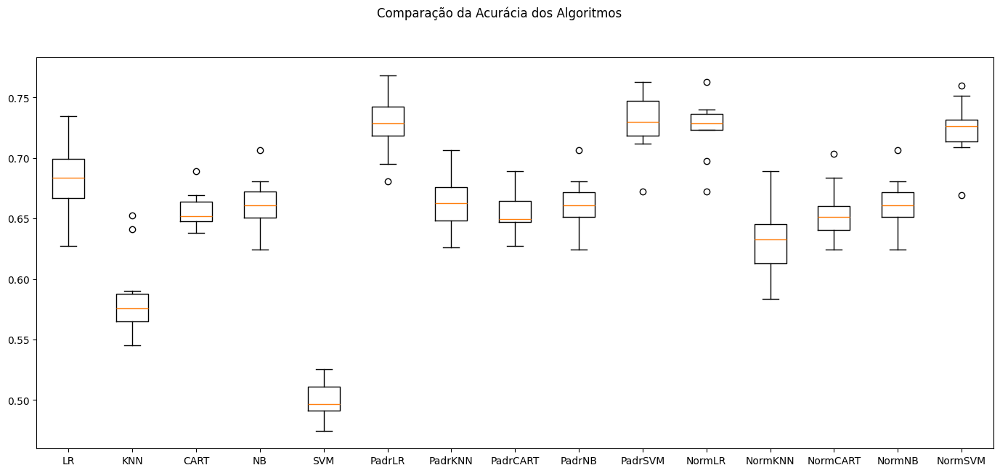

In [ ]:
# Pipelines do dataset e aplicação do modelo
models = []
bases = []
pipelines = []
results = []
names = []

#Ensembles e bases estimators
# definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3


# dados brutos
pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
pipelines.append(('SVM', Pipeline([('SVM', SVC())])))

# dados padronizados
pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))

# dados normalizados
pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))

# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

# boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Resultado do treinamento dos modelos na base final pré-processada:

* KNN: 0.585473 (0.032956)
* CART: 0.651878 (0.016086)
* NB: 0.662045 (0.021915)
* SVM: 0.499294 (0.015124)
* **PadrLR: 0.727039 (0.024438)**
* PadrKNN: 0.661476 (0.022330)
* PadrCART: 0.651311 (0.020353)
* PadrNB: 0.662045 (0.021511)
* **=> PadrSVM: 0.728455 (0.024109) <=**
* NormLR: 0.724781 (0.023367)
* NormKNN: 0.630673 (0.028778)
* NormCART: 0.651877 (0.016753)
* NormNB: 0.662045 (0.021511)
* NormSVM: 0.723650 (0.023539)

Novamente os algoritmos SVM [0.728455 (0.024109)] e Regressão Logística [0.727039 (0.024438)] treinados com dados padronizados, apresentaram as melhores acurácias (72%), entretanto menores do que as, quando treinados com a base de dados sem tratamento.

##5.3 Base completa Classificação Binária


Transformando o problema de classificação ternária em binária, eliminaremos as classes "Dropout" e "Enrolled" e as agruparemos em uma nova classe chamada "NotGraduate". O modelo dummy seguirá com resultado de 50%, mas agora a distribuição dos dados entre as classes estará balanceada.

Agrupando as classes enrolled e dropout em uma nova classe chamada "NotGraduated". As instâncias classificadas como enrolled e dropout(coluna Target) serão atualizadas para "NotGraduate" na coluna target.

In [ ]:
datasetCompletoClassificacaoBinaria = datasetCompleto[['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification',
       'Fathers qualification', 'Mothers occupation', 'Fathers occupation',
       'Admission grade', 'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP', 'Target']]

In [ ]:
datasetCompletoClassificacaoBinaria.shape

(4424, 37)

Consultando tuplas classificadas como "Enrolled" para atualizá-las para a nova classe "NotGraduate".

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Enrolled']

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
16,1,18,1,9238,1,1,137.0,1,19,38,...,0,6,14,2,11.000000,0,10.8,1.4,1.74,Enrolled
19,1,1,1,9853,1,1,140.0,1,19,19,...,0,7,8,6,13.500000,0,16.2,0.3,-0.92,Enrolled
21,1,18,4,9556,1,1,127.0,1,1,38,...,0,8,9,8,11.425000,0,12.7,3.7,-1.70,Enrolled
25,1,1,1,9238,1,1,151.0,1,19,38,...,0,6,12,4,11.000000,0,7.6,2.6,0.32,Enrolled
27,1,1,1,9085,1,1,138.0,1,19,19,...,0,5,7,4,13.000000,0,9.4,-0.8,-3.12,Enrolled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4397,1,5,4,9853,1,1,116.0,1,3,38,...,0,6,9,3,11.666667,0,9.4,-0.8,-3.12,Enrolled
4402,1,18,2,9853,1,1,168.0,1,1,19,...,0,6,6,6,13.000000,0,10.8,1.4,1.74,Enrolled
4406,1,1,1,9070,1,1,145.0,1,1,38,...,0,6,8,2,11.333333,0,10.8,1.4,1.74,Enrolled
4412,1,43,1,9070,1,1,125.0,1,19,19,...,2,6,7,5,12.200000,0,13.9,-0.3,0.79,Enrolled


Consultando tuplas classificadas como "Dropout" para atualizá-las para a nova classe "NotGraduate".

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Dropout']

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
7,1,18,4,9254,1,1,119.0,1,37,37,...,0,5,5,0,0.000000,0,15.5,2.8,-4.06,Dropout
9,1,1,1,9238,1,1,138.0,1,1,19,...,0,6,14,2,13.500000,0,8.9,1.4,3.51,Dropout
12,1,1,2,9853,1,1,133.0,1,19,37,...,0,6,0,0,0.000000,0,12.7,3.7,-1.70,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4408,2,39,1,9773,1,1,100.0,1,37,37,...,0,6,10,6,11.666667,0,12.7,3.7,-1.70,Dropout
4411,1,44,1,9130,1,39,150.0,1,37,37,...,0,6,11,3,13.333333,0,13.9,-0.3,0.79,Dropout
4415,4,39,1,9500,1,19,133.1,1,37,37,...,0,7,12,3,11.083333,0,11.1,0.6,2.02,Dropout
4420,1,1,2,9773,1,1,120.0,105,1,1,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout


Atualizando as tuplas classificadas como classes "Enrolled" e "Dropout" para "NotGraduate".

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Enrolled', 'Target'] = 'NotGraduate'
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Dropout', 'Target'] = 'NotGraduate'

Confirmando que não existem mais instâncias da classe "Enrolled"

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Enrolled']

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


Confirmando que não existem mais instâncias da classe "Dropout"

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'Dropout']

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


Consultando as tuplas da nova classe "NotGraduate"

In [ ]:
datasetCompletoClassificacaoBinaria.loc[datasetCompletoClassificacaoBinaria['Target'] == 'NotGraduate']

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mothers qualification,Fathers qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,NotGraduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,NotGraduate
7,1,18,4,9254,1,1,119.0,1,37,37,...,0,5,5,0,0.000000,0,15.5,2.8,-4.06,NotGraduate
9,1,1,1,9238,1,1,138.0,1,1,19,...,0,6,14,2,13.500000,0,8.9,1.4,3.51,NotGraduate
12,1,1,2,9853,1,1,133.0,1,19,37,...,0,6,0,0,0.000000,0,12.7,3.7,-1.70,NotGraduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4412,1,43,1,9070,1,1,125.0,1,19,19,...,2,6,7,5,12.200000,0,13.9,-0.3,0.79,NotGraduate
4413,1,43,1,33,1,1,143.0,1,37,1,...,2,8,10,2,13.000000,0,12.4,0.5,1.79,NotGraduate
4415,4,39,1,9500,1,19,133.1,1,37,37,...,0,7,12,3,11.083333,0,11.1,0.6,2.02,NotGraduate
4420,1,1,2,9773,1,1,120.0,105,1,1,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,NotGraduate


Confirmando que o dataset transformado em classificação binária está balanceado.

In [ ]:
# modelo dummy
total=len(datasetCompletoClassificacaoBinaria['Target'])
num = pd.DataFrame(datasetCompletoClassificacaoBinaria.groupby('Target').size(),columns=['%'])
perc = round(num/total,2)
print(perc)

               %
Target          
Graduate     0.5
NotGraduate  0.5


Particionando o dataset, agora com classificação binária.

In [ ]:
# Separação em conjuntos de treino e teste (dataset original)
# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = datasetCompletoClassificacaoBinaria.values
# Separação das variáveis preditoras e da variável target
X = array[:,0:36]
y = array[:,36]
#X_train, X_test, y_train, y_test = train_test_split(X, y,
#    test_size=test_size, shuffle=True, random_state=seed) # sem estratificação
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=test_size, shuffle=True, random_state=seed, stratify=y) # com estratificação

Treinando os modelos na base Classificação Binária

LR: 0.811525 (0.021137)
KNN: 0.687192 (0.029554)
CART: 0.782703 (0.028154)
NB: 0.742866 (0.016509)
SVM: 0.480079 (0.018828)
PadrLR: 0.845155 (0.015083)
PadrKNN: 0.768008 (0.018662)
PadrCART: 0.782424 (0.019118)
PadrNB: 0.742866 (0.015461)
PadrSVM: 0.832721 (0.016749)
NormLR: 0.840636 (0.015346)
NormKNN: 0.746248 (0.020786)
NormCART: 0.788073 (0.021052)
NormNB: 0.742866 (0.015461)
NormSVM: 0.833000 (0.020377)


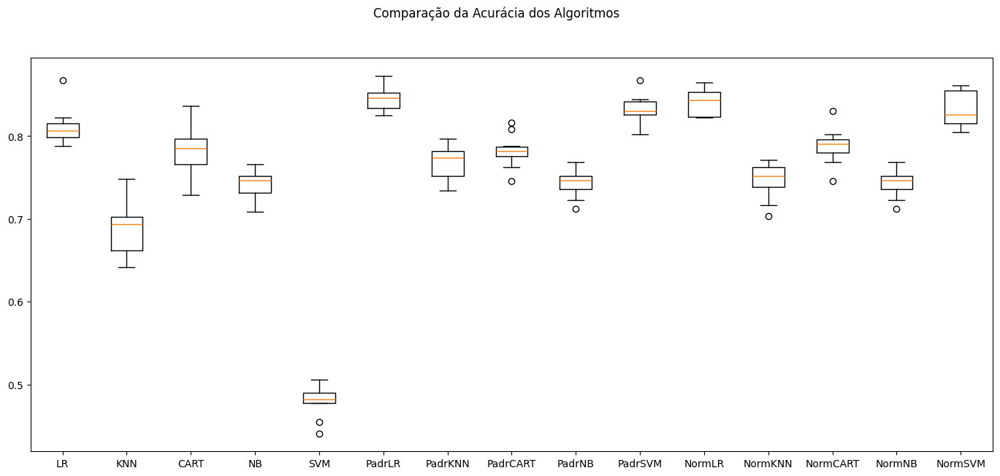

In [ ]:
# Pipelines do dataset e aplicação do modelo
models = []
bases = []
pipelines = []
results = []
names = []

#Ensembles e bases estimators
# definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3


# dados brutos
pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
pipelines.append(('SVM', Pipeline([('SVM', SVC())])))

# dados padronizados
pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))

# dados normalizados
pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))

# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

# boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Os resultados foram:

* LR: 0.811525 (0.021137)
* KNN: 0.687192 (0.029554)
* CART: 0.782703 (0.028154)
* NB: 0.742866 (0.016509)
* SVM: 0.480079 (0.018828)
* **PadrLR: 0.845155 (0.015083)**
* PadrKNN: 0.768008 (0.018662)
* PadrCART: 0.782424 (0.019118)
* PadrNB: 0.742866 (0.015461)
* PadrSVM: 0.832721 (0.016749)
* **NormLR: 0.840636 (0.015346)**
* NormKNN: 0.746248 (0.020786)
* NormCART: 0.788073 (0.021052)
* NormNB: 0.742866 (0.015461)
* **NormSVM: 0.833000 (0.020377)**

Quando submetidos à base completa sem tratamento e convertida em problema de classificaão binária, o algoritmo Regressão Logística treinado com dados padronizados apresentou acurácia de 84% [0.845155 (0.015083)]. Os algoritmos Regressão Logística e SVM, quando treinados com os dados normalizados, também apresentaram boas acurácias, respectivamente 84% e 83%.

##5.4 Base pré-processada Classificação Binária

Transformando o dataset pré-processado em um problema de classificação binária, agrupando as instâncias das classes Enrolled e Dropout em uma nova classe "NotGraduate".

In [ ]:
datasetPreProcessadoClassificacaoBinaria = datasetPreProcessado[['Application order', 'Course', 'Previous qualification',
       'Fathers qualification', 'Mothers occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor', 'Gender',
       'Scholarship holder', 'Age at enrollment',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP', 'Target']]

In [ ]:
datasetPreProcessadoClassificacaoBinaria.shape

(4424, 18)

Consultando as tuplas classificadas como "Enrolled".

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Enrolled']

,Application order,Course,Previous qualification,Fathers qualification,Mothers occupation,Admission grade,Displaced,Educational special needs,Debtor,Gender,Scholarship holder,Age at enrollment,Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
16,1,9238,1,38,5,137.4,1,0,0,0,0,18,2,0,10.8,1.4,1.74,Enrolled
19,1,9853,1,19,7,124.6,1,0,0,0,0,18,6,0,16.2,0.3,-0.92,Enrolled
21,4,9556,1,38,4,121.8,1,0,0,0,0,20,8,0,12.7,3.7,-1.70,Enrolled
25,1,9238,1,38,9,157.0,1,0,1,0,1,18,4,0,7.6,2.6,0.32,Enrolled
27,1,9085,1,19,3,131.0,1,0,0,0,0,18,4,0,9.4,-0.8,-3.12,Enrolled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4397,4,9853,1,38,3,110.4,1,0,0,0,0,21,3,0,9.4,-0.8,-3.12,Enrolled
4402,2,9853,1,19,3,126.8,1,0,0,1,0,18,6,0,10.8,1.4,1.74,Enrolled
4406,1,9070,1,38,5,127.5,1,0,0,1,0,20,2,0,10.8,1.4,1.74,Enrolled
4412,1,9070,1,19,7,133.4,1,0,0,1,1,19,5,0,13.9,-0.3,0.79,Enrolled


Consultando as tuplas classificadas como "Dropout".

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Dropout']

,Application order,Course,Previous qualification,Fathers qualification,Mothers occupation,Admission grade,Displaced,Educational special needs,Debtor,Gender,Scholarship holder,Age at enrollment,Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,5,171,1,12,5,127.3,1,0,0,1,0,20,0,0,10.8,1.4,1.74,Dropout
2,5,9070,1,37,9,124.8,1,0,0,1,0,19,0,0,10.8,1.4,1.74,Dropout
7,4,9254,1,37,9,113.1,1,0,0,1,0,22,0,0,15.5,2.8,-4.06,Dropout
9,1,9238,1,19,4,123.0,1,0,1,0,0,18,2,0,8.9,1.4,3.51,Dropout
12,2,9853,1,37,4,130.2,1,0,0,0,0,19,0,0,12.7,3.7,-1.70,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4408,1,9773,1,37,9,133.0,0,0,0,1,0,47,6,0,12.7,3.7,-1.70,Dropout
4411,1,9130,39,37,9,150.0,1,0,0,1,0,21,3,0,13.9,-0.3,0.79,Dropout
4415,1,9500,19,37,6,117.8,0,0,1,0,0,46,3,0,11.1,0.6,2.02,Dropout
4420,2,9773,1,1,9,119.0,1,0,1,0,0,18,2,0,11.1,0.6,2.02,Dropout


Atualizando as instâncias das classes "Enrolled" e "Dropout" para "NotGraduate"

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Enrolled', 'Target'] = 'NotGraduate'
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Dropout', 'Target'] = 'NotGraduate'

Confirmando que não existem mais instâncias da classe "Enrolled".

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Enrolled']

,Application order,Course,Previous qualification,Fathers qualification,Mothers occupation,Admission grade,Displaced,Educational special needs,Debtor,Gender,Scholarship holder,Age at enrollment,Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


Confirmando que não existem mais instâncias da classe "Dropout".

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'Dropout']

,Application order,Course,Previous qualification,Fathers qualification,Mothers occupation,Admission grade,Displaced,Educational special needs,Debtor,Gender,Scholarship holder,Age at enrollment,Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target


Consultando as tuplas agora classificadas como "NotGraduate".

In [ ]:
datasetPreProcessadoClassificacaoBinaria.loc[datasetPreProcessadoClassificacaoBinaria['Target'] == 'NotGraduate']

,Application order,Course,Previous qualification,Fathers qualification,Mothers occupation,Admission grade,Displaced,Educational special needs,Debtor,Gender,Scholarship holder,Age at enrollment,Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,5,171,1,12,5,127.3,1,0,0,1,0,20,0,0,10.8,1.4,1.74,NotGraduate
2,5,9070,1,37,9,124.8,1,0,0,1,0,19,0,0,10.8,1.4,1.74,NotGraduate
7,4,9254,1,37,9,113.1,1,0,0,1,0,22,0,0,15.5,2.8,-4.06,NotGraduate
9,1,9238,1,19,4,123.0,1,0,1,0,0,18,2,0,8.9,1.4,3.51,NotGraduate
12,2,9853,1,37,4,130.2,1,0,0,0,0,19,0,0,12.7,3.7,-1.70,NotGraduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4412,1,9070,1,19,7,133.4,1,0,0,1,1,19,5,0,13.9,-0.3,0.79,NotGraduate
4413,1,33,1,1,9,121.2,1,0,0,1,0,25,2,0,12.4,0.5,1.79,NotGraduate
4415,1,9500,19,37,6,117.8,0,0,1,0,0,46,3,0,11.1,0.6,2.02,NotGraduate
4420,2,9773,1,1,9,119.0,1,0,1,0,0,18,2,0,11.1,0.6,2.02,NotGraduate


Confirmando que o dataset pré-processado agora é um problema de classificação binária e está balanceado. A expectativa é encontrar um modelo com acurácia maior que 84%.

In [ ]:
# modelo dummy
total=len(datasetPreProcessadoClassificacaoBinaria['Target'])
num = pd.DataFrame(datasetPreProcessadoClassificacaoBinaria.groupby('Target').size(),columns=['%'])
perc = round(num/total,2)
print(perc)

               %
Target          
Graduate     0.5
NotGraduate  0.5


Particionando o dataset pré-procesado e de classificação binária em treino e teste.

In [ ]:
# Separação em conjuntos de treino e teste (dataset original)
# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = datasetPreProcessadoClassificacaoBinaria.values
# Separação das variáveis preditoras e da variável target
X = array[:,0:17]
y = array[:,17]
#X_train, X_test, y_train, y_test = train_test_split(X, y,
#    test_size=test_size, shuffle=True, random_state=seed) # sem estratificação
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=test_size, shuffle=True, random_state=seed, stratify=y) # com estratificação

Treinando os modelos com o dataset pré-processado e transformado em classificação binária.

LR: 0.801920 (0.012624)
KNN: 0.675607 (0.017094)
CART: 0.755298 (0.013552)
NB: 0.751911 (0.011136)
SVM: 0.480079 (0.018828)
PadrLR: 0.801363 (0.015960)
PadrKNN: 0.740882 (0.020790)
PadrCART: 0.756429 (0.019715)
PadrNB: 0.749369 (0.012151)
PadrSVM: 0.812940 (0.017375)
NormLR: 0.799945 (0.014263)
NormKNN: 0.718845 (0.020874)
NormCART: 0.757281 (0.022276)
NormNB: 0.749369 (0.012151)
NormSVM: 0.803051 (0.017566)


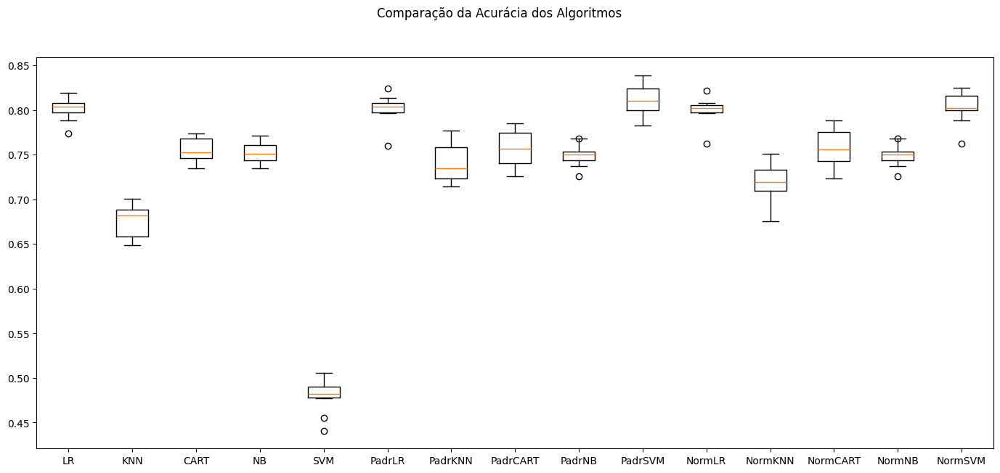

In [ ]:
# Pipelines do dataset e aplicação do modelo
models = []
bases = []
pipelines = []
results = []
names = []

#Ensembles e bases estimators
# definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3


# dados brutos
pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
pipelines.append(('SVM', Pipeline([('SVM', SVC())])))

# dados padronizados
pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))

# dados normalizados
pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))

# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

# boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Os resultados foram:

* **LR: 0.801920 (0.012624)**
* KNN: 0.675607 (0.017094)
* CART: 0.756147 (0.020045)
* NB: 0.751911 (0.011136)
* SVM: 0.480079 (0.018828)
* PadrLR: 0.801363 (0.015960)
* PadrKNN: 0.740882 (0.020790)
* PadrCART: 0.762927 (0.018802)
* PadrNB: 0.749369 (0.012151)
* **PadrSVM: 0.812940 (0.017375)**
* NormLR: 0.799945 (0.014263)
* NormKNN: 0.718845 (0.020874)
* NormCART: 0.757560 (0.017794)
* NormNB: 0.749369 (0.012151)
* **NormSVM: 0.803051 (0.017566)**

O algoritmo SVM, treinado com dados padronizados, atingiu acurácia de 81%, entretanto não foi melhor do que a acurácia de 84%, encontrada nos testes anteriores. Os aloritmos Regressão Logística, treinado com dados brutos, e novamente o SVM, treinado com dados normalizados, também resultaram em boas acurácias, ambas 80%.

##5.5 Ensembles

Os métodos Ensembles são meta-algoritmos, que combinam diversos algoritmos a fim de melhorar os resultados, diminuir a variância ou o viés. Os métodos podem ser paralelos ou sequenciais, além de adotar estratégias diferentes de agrupamento, como voting, bagging e boosting.
Pelos benefícios descritos, testaremos 6 métodos Ensembles e avaliaremos se seus desempenhos superarão os resultados obtidos com os algoritmos anteriormente observados nas 4 bases já treinadas nos modelos anteriores.

Os ensembles testados são :Bagging com Árvore de Decisão (BG), Florestas Aleatórias (RF), Árvores Extras (ET), Adaptive Boosting com Árvore de Decisão (AB), Gradiente Boosting (GB) e Ensemble Voting (VOTING). Novamente será usada a validação cruzada de 10 camadas para comparar a aplicação desses métodos nos mesmos 2 datasets, que propiciaram os melhores resultados (base completa classificação binária e base pré-processada classifica~ção binária), combinando dados brutos, normalizados e padronizados). A acurácia também será o indicador utilizado para termos uma comparação correta.


Bagging: 0.844026 (0.017611)
RF: 0.840636 (0.017980)
ET: 0.842045 (0.016647)
Ada: 0.841198 (0.018940)
GB: 0.848262 (0.017327)
Voting: 0.738909 (0.021629)
PadrBagging: 0.844307 (0.015228)
PadrRF: 0.841199 (0.014820)
PadrET: 0.843464 (0.022397)
PadrAda: 0.841198 (0.018940)
PadrGB: 0.848262 (0.017327)
PadrVoting: 0.833291 (0.019979)
NormBagging: 0.839789 (0.020228)
NormRF: 0.846569 (0.021614)
NormET: 0.842615 (0.023575)
NormAda: 0.841198 (0.018940)
NormGB: 0.848544 (0.017380)
NormVoting: 0.826224 (0.022909)


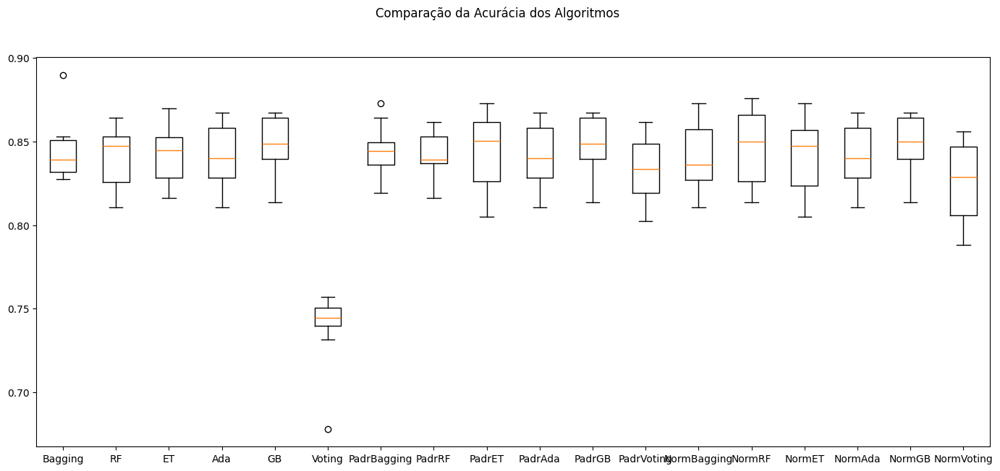

In [ ]:
# Semente para reprodutibilidade do projeto, kfolds e scoring
np.random.seed(2022)

 # número de folds da validação cruzada
num_particoes = 10
seed=2022
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size,stratify=y)



# Pipelines doS dataset e aplicação do modelo
models = []
bases = []
pipelines = []
results = []
names = []

#Ensembles e bases estimators
# definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3

# criando os modelos para o VotingClassifier
bases = []
model1 = LogisticRegression(max_iter=200)
bases.append(('logistic', model1))
model2 = DecisionTreeClassifier()
bases.append(('cart', model2))
model3 = KNeighborsClassifier()
bases.append(('knn', model3))
model4 = SVC()
bases.append(('svm', model4))

# dados brutos
pipelines.append(('Bagging', Pipeline([('Bagging', BaggingClassifier(estimator=base, n_estimators=num_trees))])))
pipelines.append(('RF', Pipeline([('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('ET', Pipeline([('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('Ada', Pipeline([('Ada', AdaBoostClassifier(n_estimators=num_trees))])))
pipelines.append(('GB', Pipeline([('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
pipelines.append(('Voting', Pipeline([('Voting', VotingClassifier(bases))])))

# dados padronizados
pipelines.append(('PadrBagging', Pipeline([('StandardScaler', StandardScaler()),('Bagging', BaggingClassifier(estimator=base, n_estimators=num_trees))])))
pipelines.append(('PadrRF', Pipeline([('StandardScaler', StandardScaler()),('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('PadrET', Pipeline([('StandardScaler', StandardScaler()),('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('PadrAda', Pipeline([('StandardScaler', StandardScaler()),('Ada', AdaBoostClassifier(n_estimators=num_trees))])))
pipelines.append(('PadrGB', Pipeline([('StandardScaler', StandardScaler()),('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
pipelines.append(('PadrVoting', Pipeline([('StandardScaler', StandardScaler()),('Voting', VotingClassifier(bases))])))

# dados normalizados
pipelines.append(('NormBagging', Pipeline([('MinMaxScaler', MinMaxScaler()),('Bagging', BaggingClassifier(estimator=base, n_estimators=num_trees))])))
pipelines.append(('NormRF', Pipeline([('MinMaxScaler', MinMaxScaler()),('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('NormET', Pipeline([('MinMaxScaler', MinMaxScaler()),('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))])))
pipelines.append(('NormAda', Pipeline([('MinMaxScaler', MinMaxScaler()),('Ada', AdaBoostClassifier(n_estimators=num_trees))])))
pipelines.append(('NormGB', Pipeline([('MinMaxScaler', MinMaxScaler()),('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
pipelines.append(('NormVoting', Pipeline([('MinMaxScaler', MinMaxScaler()),('Voting', VotingClassifier(bases))])))

# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

   # boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Os resultads do treinmento dos Ensembles com o dataset completo Classificação Binaria teve os resultados:

* Bagging: 0.844026 (0.017611)
* RF: 0.840636 (0.017980)
* ET: 0.842045 (0.016647)
* Ada: 0.841198 (0.018940)
* **GB: 0.848262 (0.017327)**
* Voting: 0.738909 (0.021629)
* PadrBagging: 0.844307 (0.015228)
* PadrRF: 0.841199 (0.014820)
* PadrET: 0.843464 (0.022397)
* PadrAda: 0.841198 (0.018940)
* **PadrGB: 0.848262 (0.017327)**
* PadrVoting: 0.833291 (0.019979)
* NormBagging: 0.839789 (0.020228)
* NormRF: 0.846569 (0.021614)
* NormET: 0.842615 (0.023575)
* NormAda: 0.841198 (0.018940)
* **NormGB: 0.848544 (0.017380)**
* NormVoting: 0.826224 (0.022909)

O algoritmo ensemble Gradient Boosting, tanto com dados brutos, padronizados ou normalizados, atingiu ótimas acurácias de 84,85% e 84,82%.

##5.6 Tuning dos Algoritmos


Uma vez identificados os algoritmos, cujos treinamentos resultaram nas maiores acurácias de treinamento e menores desvios padrões, submetemos os 3 algoritmos selecionados para execução do tuning dos respectivos hiperparâmetros em busca de uma acurácia de treino ainda melhor.

Nesta tarefa, que consiste no exaustivo e demorado experimento de muitas combinações de hiperparâmetros de cada algoritmo, utilizamos a função GridSearchCV da biblioteca Scikit-Learn para agilidade do processo. Ao final desta tarefa identificamos que o melhor modelo foi o ensemble Gradient Boosting com a combinação de hiperparâmetros e valores, que seguem: learning_rate= 0.9, loss= 'exponential' e n_estimators= 40. Tanto com dados brutos, como com dados padronizados, modelos com acurácia de 85,36% foram obtidos.


###5.6.1 Gradient Boosting

In [ ]:
#pipelines.append(('GB', Pipeline([('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
#pipelines.append(('PadrGB', Pipeline([('StandardScaler', StandardScaler()),('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
#pipelines.append(('NormGB', Pipeline([('MinMaxScaler', MinMaxScaler()),('GB', GradientBoostingClassifier(n_estimators=num_trees))])))
# Tuning do GradientBoostingClassifier()

# Baseado em https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html

np.random.seed(2022) # definindo uma semente global

 # número de folds da validação cruzada
num_particoes = 10
seed=2022
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size)


pipelines = []

# definindo os componentes do pipeline
gb = ('GB', GradientBoostingClassifier())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('GB-orig', Pipeline(steps=[gb]))) # OBS: "steps=" é opcional
pipelines.append(('GB-padr', Pipeline(steps=[standard_scaler, gb])))
pipelines.append(('GB-norm', Pipeline(steps=[min_max_scaler, gb])))

# Parameters of pipelines can be set using ‘__’ separated parameter names:
param_grid = {
    'GB__n_estimators': [5, 10, 20, 30, 40, 50, 60],
    'GB__learning_rate': [0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 2.0],
    'GB__loss' : ['exponential','log_loss'],
}

# Dataset sem tratamento de missings
for name, model in pipelines:
    # prepara e executa o GridSearchCV
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)

    # imprime a melhor configuração
    print("Resultado: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

Resultado: GB-orig - Melhor: 0.853629 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}
Resultado: GB-padr - Melhor: 0.853629 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}
Resultado: GB-norm - Melhor: 0.852782 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}


Resultados:

* Resultado: GB-orig - Melhor: 0.853629 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}
* Resultado: GB-padr - Melhor: 0.853629 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}
* Resultado: GB-norm - Melhor: 0.852782 usando {'GB__learning_rate': 0.9, 'GB__loss': 'exponential', 'GB__n_estimators': 40}

###5.6.2 Regressão Logística (LR)

In [ ]:
# Tuning Regressão logistica

np.random.seed(2022) # definindo uma semente global

 # número de folds da validação cruzada
num_particoes = 10
seed=2022
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size)

pipelines = []

# definindo os componentes do pipeline
logr = ('LR', LogisticRegression())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('LR-orig', Pipeline(steps=[logr]))) # OBS: "steps=" é opcional
pipelines.append(('LR-padr', Pipeline(steps=[standard_scaler, logr])))
pipelines.append(('LR-norm', Pipeline(steps=[min_max_scaler, logr])))

# Parameters of pipelines can be set using ‘__’ separated parameter names:
param_grid = {
    'LR__C': [0.5, 1.0, 15.0],
    'LR__max_iter': [100,200, 300],
    #'LR__penalty': ['l1', 'l2', 'none'],
    'LR__penalty': ['l2', 'none'],
    'LR__dual': [True, False],
    #'LR__tol': [0.0003,0.0002,0.0001, 0.0005],
    'LR__tol': [0.0003, 0.0001],
    'LR__fit_intercept': [False, True],
    'LR__intercept_scaling': [1.0],
    #'LR__class_weight': ['dict','balanced', None],
    'LR__class_weight': ['dict', None],
    'LR__solver': ['newton-cg','liblinear','sag', 'lbfgs'],
    'LR__multi_class': ['ovr','auto']
}

# Dataset sem tratamento de missings
for name, model in pipelines:
    # prepara e executa o GridSearchCV
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)

    # imprime a melhor configuração
    print("Resultado: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

Resultado: LR-orig - Melhor: 0.848267 usando {'LR__C': 0.5, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 100, 'LR__multi_class': 'ovr', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}
Resultado: LR-padr - Melhor: 0.847703 usando {'LR__C': 15.0, 'LR__class_weight': None, 'LR__dual': True, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 300, 'LR__multi_class': 'auto', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}
Resultado: LR-norm - Melhor: 0.847138 usando {'LR__C': 15.0, 'LR__class_weight': None, 'LR__dual': True, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 100, 'LR__multi_class': 'auto', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}


Resultados:

* Resultado: LR-orig - Melhor: 0.848267 usando {'LR__C': 0.5, 'LR__class_weight': None, 'LR__dual': False, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 100, 'LR__multi_class': 'ovr', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}
* Resultado: LR-padr - Melhor: 0.847703 usando {'LR__C': 15.0, 'LR__class_weight': None, 'LR__dual': True, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 300, 'LR__multi_class': 'auto', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}
* Resultado: LR-norm - Melhor: 0.847138 usando {'LR__C': 15.0, 'LR__class_weight': None, 'LR__dual': True, 'LR__fit_intercept': True, 'LR__intercept_scaling': 1.0, 'LR__max_iter': 100, 'LR__multi_class': 'auto', 'LR__penalty': 'l2', 'LR__solver': 'liblinear', 'LR__tol': 0.0003}

###5.6.3 SVM

In [ ]:
# treinamento e resultados
names = []#backup código antigo
# Tuning SVM

#np.random.seed(2022) # definindo uma semente global

 # número de folds da validação cruzada
num_particoes = 10
seed=2022
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size)

pipelines = []

# definindo os componentes do pipeline
svm = ('SVM', SVC())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('SVM-orig', Pipeline(steps=[svm]))) # OBS: "steps=" é opcional
pipelines.append(('SVM-padr', Pipeline(steps=[standard_scaler, svm])))
pipelines.append(('SVM-norm', Pipeline(steps=[min_max_scaler, svm])))


param_grid_SVM = {
    'SVM__C':[0.1, 0.5, 1.5, 2.1],
    'SVM__kernel':['linear', 'poly'],
    'SVM__degree':[1,5],
    'SVM__class_weight':['dict',None]
}


# Dataset sem tratamento de missings
for name, model in pipelines:
    # prepara e executa o GridSearchCV
    grid = GridSearchCV(estimator=model, param_grid=param_grid_SVM, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)

    # imprime a melhor configuração
    print("Resultado: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

Resultado: SVM-orig - Melhor: 0.838373 usando {'SVM__C': 0.1, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}
Resultado: SVM-padr - Melhor: 0.842893 usando {'SVM__C': 0.5, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}
Resultado: SVM-norm - Melhor: 0.839786 usando {'SVM__C': 2.1, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}


Resultados:

* SVM-orig - Melhor: 0.838373 usando {'SVM__C': 0.1, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}
* SVM-padr - Melhor: 0.842893 usando {'SVM__C': 0.5, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}
* SVM-norm - Melhor: 0.839786 usando {'SVM__C': 2.1, 'SVM__class_weight': None, 'SVM__degree': 1, 'SVM__kernel': 'linear'}

##5.7 Seleção de Variáveis

Nesta etapa checaremos quais são os atributos mais relevantes para o melhor modelo obter o resultado mais expressivo de acurácia de treino, minimizando o esforço do mesmo ao, se possível, reduzirmos o número de características submetidas.

####5.7.1.1 Eliminação Recursiva de Atributos

Utilizando o algoritmo ensemble Gradient Boosting, executaremos a eliminação recursiva de atributos, a escolha desse algoritmo em particular se deu ao fato dele apresentar um bom desempenho e ter um tempo rápido de resposta.

In [ ]:
# Criação do modelo
#modelo = AdaBoostClassifier(algorithm = 'SAMME', learning_rate = 1.4, n_estimators = 50)
modelo = GradientBoostingClassifier(n_estimators=40, loss='exponential', learning_rate = 0.9)

# Eliminação Recursiva de Variáveis
rfe = RFE(modelo, n_features_to_select=3)
fit = rfe.fit(X, y)

# Print dos resultados
print("Atributos Originais:", datasetCompletoClassificacaoBinaria.columns[0:36])

print("\nAtributos Selecionados: %s" % fit.support_)
print("\nRanking de atributos: %s" % fit.ranking_)
print("\nQtd de melhores Atributos: %d" % fit.n_features_)
print("\nNomes dos Atributos Selecionados: %s" % fit.get_feature_names_out(input_features=datasetCompletoClassificacaoBinaria.columns[0:36]))

Atributos Originais: Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification', 'Fathers qualification', 'Mothers occupation',
       'Fathers occupation', 'Admission grade', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular

Selecionaremos apenas os atributos 'Curricular units 2nd sem (enrolled)',  'Curricular units 2nd sem (approved)' e 'Curricular units 2nd sem (grade)', apontados como mais significativos para o modelo.

In [ ]:
#datasetCompletoClassificaoBinaria.columns
#melhores 3 atributos para o Gradient Boosting com melhor combinação de hiperparâmetros após tunning
MODELO_SELECAO2 = datasetCompletoClassificacaoBinaria[['Target', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)' ]]
print(MODELO_SELECAO2)

           Target  Curricular units 2nd sem (enrolled)  \
0     NotGraduate                                    0   
1        Graduate                                    6   
2     NotGraduate                                    6   
3        Graduate                                    6   
4        Graduate                                    6   
...           ...                                  ...   
4419     Graduate                                    6   
4420  NotGraduate                                    6   
4421  NotGraduate                                    8   
4422     Graduate                                    5   
4423     Graduate                                    6   

      Curricular units 2nd sem (approved)  Curricular units 2nd sem (grade)  
0                                       0                          0.000000  
1                                       6                         13.666667  
2                                       0                          0.

In [ ]:
MODELO_SELECAO2.columns

Index(['Target', 'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)'],
      dtype='object')

Treinando os modelos de classificação, comparados neste estudo, apenas com os 3 atributos apontados como mais relevantes pela eliminação recursiva de atributos.

KNN: 0.812092 (0.017666)
CART: 0.781291 (0.020952)
NB: 0.760953 (0.018915)
BestLR: 0.818317 (0.025258)
BestGB: 0.811247 (0.018936)
BestSVM: 0.825661 (0.016438)
PadrKNN: 0.812091 (0.019032)
PadrCART: 0.781573 (0.020803)
PadrNB: 0.760953 (0.018915)
PadrBestLR: 0.818317 (0.025258)
PadrBestGB: 0.811247 (0.018936)
PadrBestSVM: 0.825377 (0.016237)
NormKNN: 0.811811 (0.017879)
NormCART: 0.782139 (0.022104)
NormNB: 0.760953 (0.018915)
NormBestLR: 0.819164 (0.023760)
NormBestGB: 0.811247 (0.018936)
NormBestSVM: 0.815773 (0.022867)


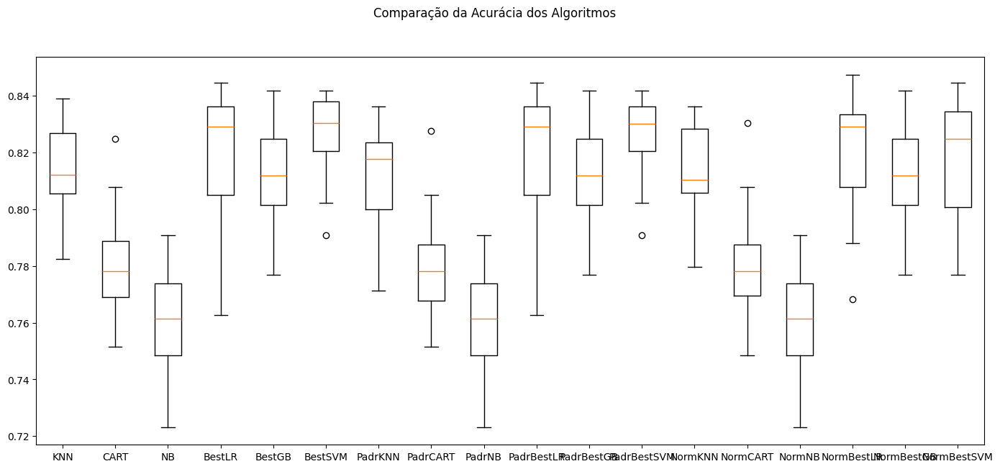

In [ ]:
np.random.seed(2022)

# número de folds da validação cruzada
num_particoes = 10
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = MODELO_SELECAO2.values

# Separação das variáveis preditoras e da variável target
y = array[:,0] # variável target
X = array[:,1:].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size,stratify=y)



# Pipelines doS dataset e aplicação do modelo
pipelines = []
results = []
names = []

# dados brutos
#pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
#pipelines.append(('SVM', Pipeline([('SVM', SVC())])))
pipelines.append(('BestLR', Pipeline([('LR', LogisticRegression(C = 0.5, class_weight = None, dual = False, fit_intercept = True, intercept_scaling = 1.0, max_iter = 100, multi_class = 'ovr', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('BestGB', Pipeline([('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('BestSVM', Pipeline([('SVM', SVC(C= 0.1, class_weight= None, degree= 1, kernel= 'linear'))])))


# dados padronizados
#pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
#pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))
pipelines.append(('PadrBestLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(C = 15.0, class_weight = None, dual = True, fit_intercept = True, intercept_scaling = 1.0, max_iter = 300, multi_class = 'auto', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('PadrBestGB', Pipeline([('StandardScaler', StandardScaler()),('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('PadrBestSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC(C= 0.5, class_weight= None, degree= 1, kernel= 'linear'))])))


# dados normalizados
#pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
#pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))
pipelines.append(('NormBestLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(C = 15.0, class_weight = None, dual = True, fit_intercept = True, intercept_scaling = 1.0, max_iter = 100, multi_class = 'auto', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('NormBestGB', Pipeline([('MinMaxScaler', MinMaxScaler()),('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('NormBestSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC(C= 2.1, class_weight= None, degree= 1, kernel= 'linear'))])))


# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

   # boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Resultados:

* KNN: 0.807288 (0.018016)
* CART: 0.785244 (0.015507)
* NB: 0.758409 (0.021081)
* BestLR: 0.818310 (0.022880)
* BestGB: 0.814628 (0.019354)
* BestSVM: 0.824809 (0.020836)
* PadrKNN: 0.806158 (0.017718)
* PadrCART: 0.784959 (0.016659)
* PadrNB: 0.758409 (0.021081)
* PadrBestLR: 0.818876 (0.022360)
* PadrBestGB: 0.814628 (0.019354)
* PadrBestSVM: 0.825092 (0.020777)
* NormKNN: 0.809546 (0.016730)
* NormCART: 0.787503 (0.016224)
* NormNB: 0.758409 (0.021081)
* NormBestLR: 0.818875 (0.022762)
* NormBestGB: 0.814628 (0.019354)
* NormBestSVM: 0.816050 (0.021493)

Seguiremos a análise com o dataset completo, caso a seleção univariada, próxima técnica de seleção de variáveis avaliada, também não indique atributos, que propiciem melhores resultados de acurácia de treino.

####5.7.1.2 Seleção Univariada

Na seleção univariada utiliza-se o teste ANOVA F-value, para estimar o quanto cada variável explicativa influencia na variável resposta.

In [ ]:
# Executa a função de pontuação em (X, y) e obtém os atributos selecionados
array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')
seed=2022

# Função para seleção de atributos
best_var = SelectKBest(score_func=f_classif, k=3)

fit = best_var.fit(X, y)

# Reduz X para os atributos selecionados
features = fit.transform(X)

# Resultados
print('\nNúmero original de atributos:', X.shape[1])
print('\nNúmero reduzido de atributos:', features.shape[1])

# Exibe os atributos orginais
print("\nAtributos Originais:", datasetCompletoClassificacaoBinaria.columns[0:35])

set_printoptions(precision=2) # 2 casas decimais
print("\nScores dos Atributos Originais:", fit.scores_)
print("\nAtributos Selecionados:", best_var.get_feature_names_out(input_features=datasetCompletoClassificacaoBinaria.columns[0:36]))

# Imprime o dataset apenas com as colunas selecionadas
print("\n", features)


Número original de atributos: 36

Número reduzido de atributos: 3

Atributos Originais: Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification', 'Fathers qualification', 'Mothers occupation',
       'Fathers occupation', 'Admission grade', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations

A técnica de seleção univariada apontou os atributos 'Curricular units 1st sem (approved)',
 'Curricular units 2nd sem (approved)' e 'Curricular units 2nd sem (grade)', como os 3 mais relevantes. Em seguida selecionaremos os 3 atributos para submetê-los aos modelos de classificação analisados neste estudo.

In [ ]:
#MODELO_SELECAO.columns
#melhores 3 atributos pela seleção univariada utilizando método ANOVA
MODELO_SELECAO = datasetCompletoClassificacaoBinaria[['Target', 'Curricular units 1st sem (approved)',
 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)' ]]
print(MODELO_SELECAO)

           Target  Curricular units 1st sem (approved)  \
0     NotGraduate                                    0   
1        Graduate                                    6   
2     NotGraduate                                    0   
3        Graduate                                    6   
4        Graduate                                    5   
...           ...                                  ...   
4419     Graduate                                    5   
4420  NotGraduate                                    6   
4421  NotGraduate                                    7   
4422     Graduate                                    5   
4423     Graduate                                    6   

      Curricular units 2nd sem (approved)  Curricular units 2nd sem (grade)  
0                                       0                          0.000000  
1                                       6                         13.666667  
2                                       0                          0.

In [ ]:
MODELO_SELECAO.columns

Index(['Target', 'Curricular units 1st sem (approved)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)'],
      dtype='object')

KNN: 0.792034 (0.020976)
CART: 0.770274 (0.024333)
NB: 0.773666 (0.015265)
BestLR: 0.807013 (0.019685)
BestGB: 0.793160 (0.019791)
BestSVM: 0.789776 (0.021252)
PadrKNN: 0.797122 (0.025168)
PadrCART: 0.769426 (0.025054)
PadrNB: 0.773666 (0.015265)
PadrBestLR: 0.807296 (0.019099)
PadrBestGB: 0.793159 (0.019311)
PadrBestSVM: 0.792041 (0.023266)
NormKNN: 0.793164 (0.019505)
NormCART: 0.769991 (0.025151)
NormNB: 0.773666 (0.015265)
NormBestLR: 0.808143 (0.018492)
NormBestGB: 0.793159 (0.020199)
NormBestSVM: 0.792319 (0.018697)


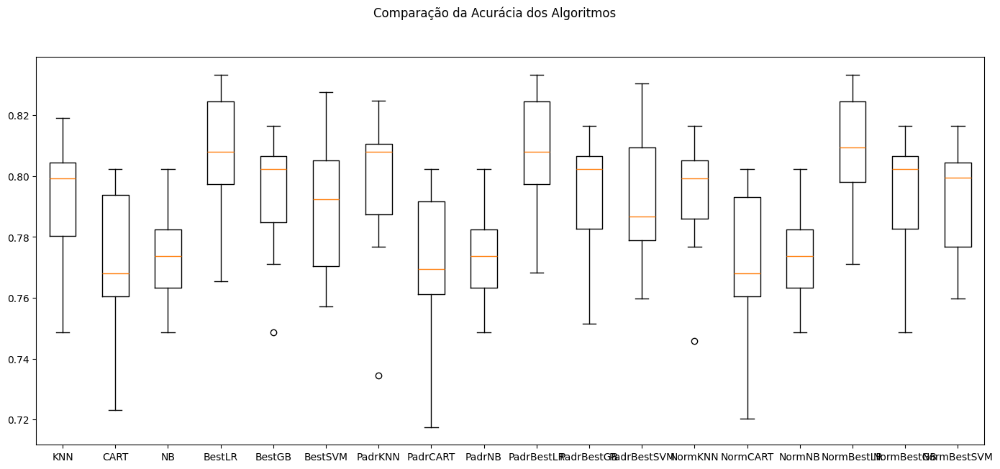

In [ ]:
np.random.seed(2022)

# número de folds da validação cruzada
num_particoes = 10
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed)

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

# Extração dos valores do dataset para um array (matriz) de dados utilizando o dataframe com a classe binária
array = MODELO_SELECAO.values

# Separação das variáveis preditoras e da variável target
y = array[:,0] # variável target
X = array[:,1:].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size,stratify=y)



# Pipelines doS dataset e aplicação do modelo
pipelines = []
results = []
names = []

# dados brutos
#pipelines.append(('LR', Pipeline([('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('KNN', Pipeline([('KNN', KNeighborsClassifier())])))
pipelines.append(('CART', Pipeline([('CART', DecisionTreeClassifier())])))
pipelines.append(('NB', Pipeline([('NB', GaussianNB())])))
#pipelines.append(('SVM', Pipeline([('SVM', SVC())])))
pipelines.append(('BestLR', Pipeline([('LR', LogisticRegression(C = 0.5, class_weight = None, dual = False, fit_intercept = True, intercept_scaling = 1.0, max_iter = 100, multi_class = 'ovr', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('BestGB', Pipeline([('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('BestSVM', Pipeline([('SVM', SVC(C= 0.1, class_weight= None, degree= 1, kernel= 'linear'))])))


# dados padronizados
#pipelines.append(('PadrLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('PadrKNN', Pipeline([('StandardScaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('PadrCART', Pipeline([('StandardScaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('PadrNB', Pipeline([('StandardScaler', StandardScaler()),('NB', GaussianNB())])))
#pipelines.append(('PadrSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC())])))
pipelines.append(('PadrBestLR', Pipeline([('StandardScaler', StandardScaler()),('LR', LogisticRegression(C = 15.0, class_weight = None, dual = True, fit_intercept = True, intercept_scaling = 1.0, max_iter = 300, multi_class = 'auto', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('PadrBestGB', Pipeline([('StandardScaler', StandardScaler()),('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('PadrBestSVM', Pipeline([('StandardScaler', StandardScaler()),('SVM', SVC(C= 0.5, class_weight= None, degree= 1, kernel= 'linear'))])))


# dados normalizados
#pipelines.append(('NormLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(max_iter=200))])))
pipelines.append(('NormKNN', Pipeline([('MinMaxScaler', MinMaxScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('NormCART', Pipeline([('MinMaxScaler', MinMaxScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('NormNB', Pipeline([('MinMaxScaler', MinMaxScaler()),('NB', GaussianNB())])))
#pipelines.append(('NormSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC())])))
pipelines.append(('NormBestLR', Pipeline([('MinMaxScaler', MinMaxScaler()),('LR', LogisticRegression(C = 15.0, class_weight = None, dual = True, fit_intercept = True, intercept_scaling = 1.0, max_iter = 100, multi_class = 'auto', penalty = 'l2', solver = 'liblinear', tol = 0.0003))])))
pipelines.append(('NormBestGB', Pipeline([('MinMaxScaler', MinMaxScaler()),('GB', GradientBoostingClassifier(loss = 'exponential', learning_rate = 0.9, n_estimators = 40))])))
pipelines.append(('NormBestSVM', Pipeline([('MinMaxScaler', MinMaxScaler()),('SVM', SVC(C= 2.1, class_weight= None, degree= 1, kernel= 'linear'))])))


# Aplicação dos pipelines
for name, model in pipelines:
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

   # boxplot de comparação dos algoritmos
fig = plt.figure(figsize = (17,7))
fig.suptitle('Comparação da Acurácia dos Algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Resultados:

* KNN: 0.792034 (0.020976)
* CART: 0.770274 (0.024333)
* NB: 0.773666 (0.015265)
* BestLR: 0.807013 (0.019685)
* BestGB: 0.793160 (0.019791)
* BestSVM: 0.789776 (0.021252)
* PadrKNN: 0.797122 (0.025168)
* PadrCART: 0.769426 (0.025054)
* PadrNB: 0.773666 (0.015265)
* PadrBestLR: 0.807296 (0.019099)
* PadrBestGB: 0.793159 (0.019311)
* PadrBestSVM: 0.792041 (0.023266)
* NormKNN: 0.793164 (0.019505)
* NormCART: 0.769991 (0.025151)
* NormNB: 0.773666 (0.015265)
* NormBestLR: 0.808143 (0.018492)
* NormBestGB: 0.793159 (0.020199)
* NormBestSVM: 0.792319 (0.018697)

As tentativas de seleção de variáveis acima não foram suficientes para obtermos acurácias ainda melhores.

#6 Finalização do Modelo

Analisando os resultados até aqui, verificamos que o modelo de melhor acurácia média para o problema foi com os dados brutos sem os tratamentos, identificados na análise exploratória e implementados na fase de pré-processamento, construído com o algoritmo ensemble Gradient Boosting, visão dados brutos ou padronizados, pois os 2 modelos apresentaram os mesmos resultados de acurácia: 85,36%.
Tal acurácia foi atingida na etapa de tuning dos hiperparâmetros. Além dos resultados, outro ponto positivo no algoritmo ensemble Gradient Boosting é a performance, no que tange ao tempo de execução bem inferior, por exemplo, ao SVM.

A seguir, finalizaremos este modelo, treinando-o em todo o conjunto de dados de treinamento (sem validação cruzada) e faremos predições para o conjunto de dados de teste que foi separado logo no início do exemplo, a fim de confirmarmos nossas descobertas.

Primeiro, realizaremos a padronização dos dados de entrada. Depois, treinaremos o modelo e exibiremos a acurácia de teste, a matriz de confusão e o relatório de classificação.

In [ ]:
np.random.seed(2022) # definindo uma semente global

# definindo a métrica de avaliação dos algoritmos
scoring = 'accuracy'

array = datasetCompletoClassificacaoBinaria.values

# Separação das variáveis preditoras e da variável target
y = array[:,36] # variável target
X = array[:,0:36].astype('float')

# Definição da proporção do conjunto de teste
test_size = 0.20

# Separação em dados de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size)


In [ ]:
# Preparação do modelo
scaler = StandardScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX = scaler.transform(X_train) # aplicação da padronização no conjunto de treino

model = GradientBoostingClassifier(learning_rate= 0.9, loss= 'exponential',n_estimators= 40)

model.fit(rescaledX, y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX = scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions = model.predict(rescaledTestX)
print(accuracy_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

0.8327683615819209
[[379  64]
 [ 84 358]]
              precision    recall  f1-score   support

    Graduate       0.82      0.86      0.84       443
 NotGraduate       0.85      0.81      0.83       442

    accuracy                           0.83       885
   macro avg       0.83      0.83      0.83       885
weighted avg       0.83      0.83      0.83       885



Por meio do conjunto de teste, verificamos que alcançamos uma acurácia de 83% em dados não vistos. Este resultado satisfaz a condição que buscamos de encontrar valores de acurácia acima de 50%. Valores semelhantes são esperados, quando este modelo estiver executando em produção e fazendo predições para novos dados. Os percentuais similares de acurácias de treino e teste, também apontam o poder de generalização do melhor modelo e que o estudo não sofreu impacto dos conhecidos e temidos problemas de underfiting e overfiting.

Vamos agora preparar o modelo para utilização em produção. Para isso, vamos treiná-lo com todo o dataset, e não apenas o conjunto de treino.

In [ ]:
#Preparação do modelo com TODO o datset
scaler = StandardScaler().fit(X) # ajuste do scaler com TODO o conjunto de dados
rescaledX = scaler.transform(X) # aplicação da padronização com TODO o conjunto de dados
model.fit(rescaledX, y)

GradientBoostingClassifier(learning_rate=0.9, loss='exponential',
                           n_estimators=40)

#### 6.1 Aplicando o modelo em dados não vistos

Por fim, submeteremos o modelo a dados não vistos, simulando 3 novas instâncias, cujas classes não conhecemos. O objetivo é confirmar que o modelo recém-treinado seja capaz de realizar a predição das classes. Para tal, os novos serão padronizados com a mesma escala dos dados utilizados no treinamento.

In [ ]:
#Novos dados - as classes não são conhecidas
data = {'Marital status':[ 4, 2, 1],
		'Application mode':[ 15, 44, 42],
		'Application order':[ 0, 9, 5],
		'Course':[ 9119, 9773, 9003],
       'Daytime/evening attendance\t':[ 0, 0, 1],
	   'Previous qualification':[ 39, 5, 4],
       'Previous qualification (grade)':[ 150, 180, 113],
	   'Nacionality':[ 41, 2, 109],
       'Mothers qualification':[ 22, 4, 5],
	   'Fathers qualification':[ 2, 39, 44],
	   'Mothers occupation':[ 1, 4, 6],
       'Fathers occupation':[ 141, 134, 122],
	   'Admission grade':[ 143, 187, 124],
	   'Displaced':[ 1, 0, 0],
       'Educational special needs':[ 0, 0, 1],
	   'Debtor':[ 0, 0, 1],
	   'Tuition fees up to date':[ 1, 1, 0],
       'Gender':[ 1, 0, 1],
	   'Scholarship holder':[ 0, 1, 0],
	   'Age at enrollment':[ 48, 36, 28],
	   'International':[ 1, 0, 0],
       'Curricular units 1st sem (credited)':[ 15, 12, 8],
       'Curricular units 1st sem (enrolled)':[ 15, 12, 10],
       'Curricular units 1st sem (evaluations)':[ 4, 4, 3],
       'Curricular units 1st sem (approved)':[ 3, 4, 2],
       'Curricular units 1st sem (grade)':[ 10, 16, 8],
       'Curricular units 1st sem (without evaluations)':[ 0, 0, 1],
       'Curricular units 2nd sem (credited)':[ 10, 12, 10],
       'Curricular units 2nd sem (enrolled)':[ 8, 12, 8],
       'Curricular units 2nd sem (evaluations)':[ 8, 12, 7],
       'Curricular units 2nd sem (approved)':[ 8, 12, 6],
       'Curricular units 2nd sem (grade)':[ 12, 18, 10],
       'Curricular units 2nd sem (without evaluations)':[ 0, 0, 1],
	   'Unemployment rate':[ 20, 1, 10],
       'Inflation rate':[ 8, -2, 1],
	   'GDP':[ 4, 7, 2], }


atributos = ['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mothers qualification', 'Fathers qualification', 'Mothers occupation',
       'Fathers occupation', 'Admission grade', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Unemployment rate',
       'Inflation rate', 'GDP']

entrada = pd.DataFrame(data, columns=atributos)



In [ ]:
entrada.shape

(3, 36)

In [ ]:
array_entrada = entrada.values
X_entrada = array_entrada[:,0:36].astype(float)

#Padronização nos dados de entrada usando o scaler utiliado em x
rescaledEntradaX = scaler.transform(X_entrada)
print(rescaledEntradaX)

[[ 4.66 -0.21 -1.32  0.13 -2.86  3.37  1.32  5.66  0.16 -1.32 -0.38  5.15
   1.11  0.91 -0.11 -0.36  0.37  1.36 -0.57  3.26  6.26  6.05  3.52 -1.03
  -0.55 -0.13 -0.2   4.93  0.81 -0.02  1.18  0.34 -0.2   3.17  4.9   1.76]
 [ 1.36  1.45  5.54  0.44 -2.86  0.04  3.59  0.02 -1.    1.09 -0.26  4.87
   4.15 -1.1  -0.11 -0.36  0.37 -0.74  1.74  1.68 -0.16  4.78  2.31 -1.03
  -0.23  1.11 -0.2   5.97  2.63  1.    2.51  1.49 -0.2  -3.97 -2.33  3.08]
 [-0.29  1.33  2.49  0.07  0.35 -0.06 -1.49 15.49 -0.93  1.42 -0.19  4.39
  -0.21 -1.1   9.26  2.79 -2.72  1.36 -0.57  0.62 -0.16  3.09  1.5  -1.27
  -0.87 -0.55  1.25  4.93  0.81 -0.27  0.52 -0.04  1.13 -0.59 -0.16  0.88]]


Predição das classes dos dados não vistos

In [ ]:
#Predição de classes dos dados de entrada
saidas = model.predict(rescaledEntradaX)
print(saidas)

['NotGraduate' 'NotGraduate' 'NotGraduate']


# Conclusão

No desenvolvimento deste artigo, foram comparados os resultados obtidos em 11 modelos de classificação de aprendizado de máquina. Os dados analisados têm como fonte o conjunto de dados criado a partir de uma instituição de ensino superior (adquirido de diversas bases de dados disjuntas) relacionado a alunos matriculados em diferentes cursos de graduação. Devido ao desequilíbrio na carga de uma das classes na amosra de dados em questão, optei por simplificar o problema de classificação ternária em um de classificação binária. Isto também proporcionou a possibildiade de trabalhar com uma base de dados com uma distribuição de dados equilibrada entre as classes, sanando o incoveninente observado durante a análise exploratória.
Para a avaliação da performance dos modelos foram considerados as métricas de acurácia e o desvio padrão. Os modelos foram treinados usando a técnica de validação cruzada estratificada dez vezes, tendo sido o conjunto de dados anteriormente separado em 80% das instâncias para treinamento e 20% para teste. Na busca por melhores resultados, foram ajustados os hiperparâmetros dos modelos com os melhores resultados. O melhor modelo encontrado com ajustes dos hiperparâmetros foi o ensemble Gradient Boosting com acurácia de 85%. Como avaliação final, o melhor modelo identificado na etapa de treino foi submetido a um conjunto de dados de teste novo, com intuito de avaliar a performance do modelo em dados não vistos. O resultado encontrado na base de teste foi similar a etapa de treinamento, o que mostra um bom aspecto, pois confirma o poder de generalização do modelo.
Assim sendo, concluímos que o modelo de classificação desenvolvido, Gradient Boosting, utilizando os dados da instituição de ensino, pode fornecer uma boa predição do resultado da análise da evolução dos alunos que estudam na instituição. Portanto, o modelo torna-se uma oportunidade para auxiliar nas condições necessárias para minimizar o insucesso acadêmico dos alunos.
 Como estudos futuros, sugiro novos procedimentos e técnicas que entendemos poder melhorar a performance dos modelos, são elas:
* Realização de mais experimentos em busca de uma acurácia maior;
*	Inclusão de novas informações na base dados, sendo estas características criadas a partir dos dados de novos alunos ou de outras fontes de dados confiáveis.
*	Propor a utilização de novos algoritmos não testados neste artigo, na busca por melhores resultados de predição e, posteriormente, experimentar combinações de seus respectivos hiperparâmetros;
*	Trabalhar o problema de clasificação ternária, caso encontre uma base de dados com distribuição de dados equilibrada, o que permitirá um melhor treinamento dos modelos.
